In [1]:
%matplotlib inline

from boututils.datafile import DataFile
from boutdata.collect import collect
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os, sys, pathlib
import platform
import traceback
import xarray
import xbout
import xhermes
import scipy
import re

onedrive_path = onedrive_path = str(os.getcwd()).split("OneDrive")[0] + "OneDrive"
sys.path.append(os.path.join(onedrive_path, r"Project\python-packages\sdtools"))
sys.path.append(os.path.join(onedrive_path, r"Project\python-packages\soledge"))
sys.path.append(os.path.join(onedrive_path, r"Project\python-packages"))

from hermes3.utils import *

import gridtools.solps_python_scripts.setup
from gridtools.solps_python_scripts.utilities.last10s       import read_last10s

from hermes3.fluxes import *
from hermes3.case_db import *
from hermes3.load import *
from hermes3.named_selections import *
from hermes3.plotting import *
from hermes3.grid_fields import *
from hermes3.accessors import *

from code_comparison.code_comparison import *
from code_comparison.viewer_2d import *


%load_ext autoreload
%autoreload 2

plt.close("all")
%matplotlib inline

print("Done")


st40_phys_viewer can not be loaded from outside Tokamak Energy!

Done


# Overview

### I tuned fast recycling and went to MFP 0.1 with separate limiters and conduction limitation

# Hermes IO

In [2]:
casestore = dict()

In [3]:
   
db = CaseDB()
toload = [
    # dict(name="base", id="d19g-also_noescapecore"),
    # dict(name="esccore_edgerefl_decaylength", id="d19c-also_nofrec"),
    # dict(name="frec", id = "d19bb-new_frec"),
    # dict(name="pump", id = "d19aeb-noafn_all_newfrec_retry"),
    # dict(name="frec_tune", id = "d19aec-also_tune_frec"),
    # dict(name="afnD_mfp1", id = "d22eb-also_mfp1"),
    dict(name="afnE_mfp1", id = "d24b-tunefrec_E_AFN_mfp1.0"),
    # dict(name="afnE_mfp1_cond0.75", id = "d24ba-E_mfp1_cond0.75"),
    # dict(name="afnE_mfp1_cond0.5", id = "d24bb-E_mfp1_cond0.5"),
    # dict(name="afnE_mfp1_cond0.25", id = "d24bc-E_mfp1_cond0.25"),
    # dict(name="afnE_mfp1_cond0.1", id = "d24be-cond0.10_frec0.68"),
    # dict(name="afnE_mfp1_cond0.01", id = "d24bf-cond0.01_frec0.68"),
    # dict(name="afnE_mfp1_cond0.25_frec0.00", id = "d25c-final_no_frec"),
    # dict(name="afnE_mfp1_cond0.25_frec0.48", id = "d24bd-cond0.25_frec0.48"),
    # dict(name="afnE_mfp1_cond0.25_frec0.68", id = "d24bdb-cond0.25_frec0.68"),
    # dict(name="afnE_mfp1_cond0.25_frec0.48_nonrefl", id = "d25b-final_no_nrefl"),
    # dict(name="afnE_mfp1_1e19", id = "d25b-final_no_nrefl"),
    # dict(name="afn_unch", id = "d20bd-allbc_afnv2_mfp10_ntune"),
    # dict(name="afn_new", id = "d21-allbc_afn_vb1_newfrec"),
    # dict(name="afn_new_cond0.1", id = "d21a-cond_alpha_0.1")
]
cs = {}
for case in toload:
    cs[case["name"]] = db.load_case_2D(case["id"], use_squash = True, verbose = True)

- Reading case d24b-tunefrec_E_AFN_mfp1.0
-----------------------
- Looking for squash file
- Squash file found. squash date 10/15/2023, 22:03:01, dmp file date 10/13/2023, 18:12:51

Unnormalising with xHermes


In [4]:
plt.close("all")
%matplotlib inline

## Read Hermes data

In [5]:
hr = dict()
for name in casestore.keys(): 
    print(name)
    hr[name] = Hermesdata()
    hr[name].read_case(casestore[name].ds.isel(t=-1, x = slice(2,-2)))
    
    if "afnE" in  name:
        new_afn = True
        print(f"Loading {name} with new AFN")
    else:
        new_afn = False
        print(f"Loading {name} with old AFN")
    
    ds = casestore[name].ds
    ds = calculate_radial_fluxes(ds, new_afn = new_afn)
    # ds = calculate_target_fluxes(ds)
    ds = reverse_pfr_fluxes(ds)

# Read SOLEDGE CSV data

In [6]:
soledgecases = {
    "tightwall_1e19" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\soledge_cases\ST40_wallMike_bra_nocore_D_1e19"), # Hermes-3 like wall
    "tightwall_2e19" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\soledge_cases\ST40_wallMike_bra_nocore_D_2e19"), # Hermes-3 like wall
    "widewall_2e19_5m" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\soledge_cases\ST40_wallStd_bra_nocore_D_2e19_5M"),
    "tightwall_3e19" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\soledge_cases\ST40_wallMike_bra_nocore_D_3e19"), # Hermes-3 like wall
    "widewall_1e19" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\soledge_cases\ST40_wallStd_bra_nocore_D_1e19"), 
    "widewall_2e19" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\soledge_cases\ST40_wallStd_bra_nocore_D_2e19"), 
    "widewall_3e19" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\soledge_cases\ST40_wallStd_bra_nocore_D_3e19"), 
}

sl = dict()

for name in soledgecases:
    path = soledgecases[name]
    sl[name] = SOLEDGEdata(path = path)
    sl[name].read_csv(os.path.join(path, "omp_plasma.csv"), mode = "plot1d_omp")
    sl[name].read_csv(os.path.join(path, "omp_neutrals.csv"), mode = "plot1d_omp")
    sl[name].read_csv(os.path.join(path, "imp_plasma.csv"), mode = "plot1d_imp")
    sl[name].read_csv(os.path.join(path, "imp_neutrals.csv"), mode = "plot1d_imp")
    sl[name].read_csv(os.path.join(path, "wall_ntmpi_plasma.csv"), mode = "wall_ntmpi")



c:\Users\mikek\OneDrive\Project\python-packages\soledge\routines\h5_routines.py:65: FutureWarning: In the future `np.str` will be defined as the corresponding NumPy scalar.
  Data = Data.astype(np.str)
c:\Users\mikek\OneDrive\Project\python-packages\soledge\routines\h5_routines.py:65: FutureWarning: In the future `np.str` will be defined as the corresponding NumPy scalar.
  Data = Data.astype(np.str)
c:\Users\mikek\OneDrive\Project\python-packages\soledge\routines\h5_routines.py:65: FutureWarning: In the future `np.str` will be defined as the corresponding NumPy scalar.
  Data = Data.astype(np.str)
c:\Users\mikek\OneDrive\Project\python-packages\soledge\routines\h5_routines.py:65: FutureWarning: In the future `np.str` will be defined as the corresponding NumPy scalar.
  Data = Data.astype(np.str)
c:\Users\mikek\OneDrive\Project\python-packages\soledge\routines\h5_routines.py:65: FutureWarning: In the future `np.str` will be defined as the corresponding NumPy scalar.
  Data = Data.astyp

## Read SOLPS

In [7]:
solpscases = {
    "base" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE\HERMES_SOLEDGE.S33600_Tamb_case.SEE=0.BGK=OFF.SOLEDGE.reactions.input.dat.OK.Js=OFF.GAMMAE=4.5"),
    "noiz_core" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE\HERMES_SOLEDGE.S33600_Tamb_case.SEE=0.BGK=OFF.SOLEDGE.reactions.input.dat.OK.Js=OFF.GAMMAE=4.5.eirene_ionising_core=0.BCCON=16"),
    "gammai_2.5" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE\HERMES_SOLEDGE.S33600_Tamb_case.SEE=0.BGK=OFF.SOLEDGE.reactions.input.dat.OK.Js=OFF.GAMMAE=4.5.eirene_ionising_core=0.BCCON=16.GAMMAI=2.5E+00"),
    "dpuff_1e22" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE\HERMES_SOLEDGE.S33600_Tamb_case.SEE=0.BGK=OFF.SOLEDGE.reactions.input.dat.OK.Js=OFF.GAMMAE=4.5.eirene_ionising_core=0.BCCON=16.D2PUFF=1.0E+22"),
    "dpuff_5e21" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE\HERMES_SOLEDGE.S33600_Tamb_case.SEE=0.BGK=OFF.SOLEDGE.reactions.input.dat.OK.Js=OFF.GAMMAE=4.5.eirene_ionising_core=0.BCCON=16.D2PUFF=5.0E+21"),
    "no_fast_reflec" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE\HERMES_SOLEDGE.S33600_Tamb_case.SEE=0.BGK=OFF.SOLEDGE.reactions.input.dat.OK.Js=OFF.GAMMAE=4.5.eirene_ionising_core=0.BCCON=16.Pf=0"),
    "nsep_2e19" : os.path.join(onedrive_path,r"Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE_core_extent\.core_extent.b2tqca_phm0=0.nesepm=2E+19"),
    "nsep_3e19" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE_core_extent\.core_extent.b2tqca_phm0=0.nesepm=3E+19"),
    "narrow_core" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE_core_extent\HERMES_SOLEDGE.S33600_Tamb_case.SEE=0.BGK=OFF.SOLEDGE.reactions.input.dat.OK.Js=OFF.GAMMAE=4.5.eirene_ionising_core=0.BCCON=16.core_extent"),
    "no_visc" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE_core_extent\HERMES_SOLEDGE.S33600_Tamb_case.SEE=0.BGK=OFF.SOLEDGE.reactions.input.dat.OK.Js=OFF.GAMMAE=4.5.eirene_ionising_core=0.BCCON=16.core_extent.b2tqca_phm0=0"),
    "16x_mc" : os.path.join(onedrive_path, r"C:\Users\mikek\OneDrive\Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE_core_extent\HERMES_SOLEDGE.S33600_Tamb_case.xxx.BCCON=16.core_extent.MC.histories.x16-ish.NOT.converged"),
    "tightwall_2e19" : r"C:\Users\mikek\OneDrive\Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE_tight_wall_orthogonal_MK\HERMES_SOLEDGE.S33600_Tamb_case.SEE=0.BGK=OFF.SOLEDGE.reactions.input.dat.OK.Js=OFF.GAMMAE=4.5.NESEPM=2.0E+19",
}

sp = dict()

for name in solpscases:
    sp[name] = SOLPSdata()
    sp[name].read_last10s(solpscases[name])

c:\Users\mikek\OneDrive\Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE\HERMES_SOLEDGE.S33600_Tamb_case.SEE=0.BGK=OFF.SOLEDGE.reactions.input.dat.OK.Js=OFF.GAMMAE=4.5\last10s.pkl loaded
c:\Users\mikek\OneDrive\Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE\HERMES_SOLEDGE.S33600_Tamb_case.SEE=0.BGK=OFF.SOLEDGE.reactions.input.dat.OK.Js=OFF.GAMMAE=4.5.eirene_ionising_core=0.BCCON=16\last10s.pkl loaded
c:\Users\mikek\OneDrive\Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE\HERMES_SOLEDGE.S33600_Tamb_case.SEE=0.BGK=OFF.SOLEDGE.reactions.input.dat.OK.Js=OFF.GAMMAE=4.5.eirene_ionising_core=0.BCCON=16.GAMMAI=2.5E+00\last10s.pkl loaded
c:\Users\mikek\OneDrive\Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE\HERMES_SOLEDGE.S33600_Tamb_case.SEE=0.BGK=OFF.SOLEDGE.reactions.input.dat.OK.Js=OFF.GAMMAE=4.5.eirene_ionising_core=0.BCCON=16.D2PUFF=1.0E+22\last10s.pkl loaded
c:\Users\mikek\OneDrive\Project\collab\tech\co

# Grid images

In [10]:
slc_tight = SOLEDGEcase(path = soledgecases["tightwall_2e19"])
slc_wide = 

c:\Users\mikek\OneDrive\Project\python-packages\soledge\routines\h5_routines.py:65: FutureWarning: In the future `np.str` will be defined as the corresponding NumPy scalar.
  Data = Data.astype(np.str)


In [10]:
cs.keys()

dict_keys(['afnE_mfp1'])

In [8]:
solpscases.keys()

dict_keys(['base', 'noiz_core', 'gammai_2.5', 'dpuff_1e22', 'dpuff_5e21', 'no_fast_reflec', 'nsep_2e19', 'nsep_3e19', 'narrow_core', 'no_visc', '16x_mc', 'tightwall_2e19'])

In [13]:
spc = SOLPScase(solpscases["tightwall_2e19"])
spc.g["ny"]

38

c:\Users\mikek\OneDrive\Project\python-packages\soledge\routines\h5_routines.py:65: FutureWarning: In the future `np.str` will be defined as the corresponding NumPy scalar.
  Data = Data.astype(np.str)


999999999999999.9 6.404033964754764e+19


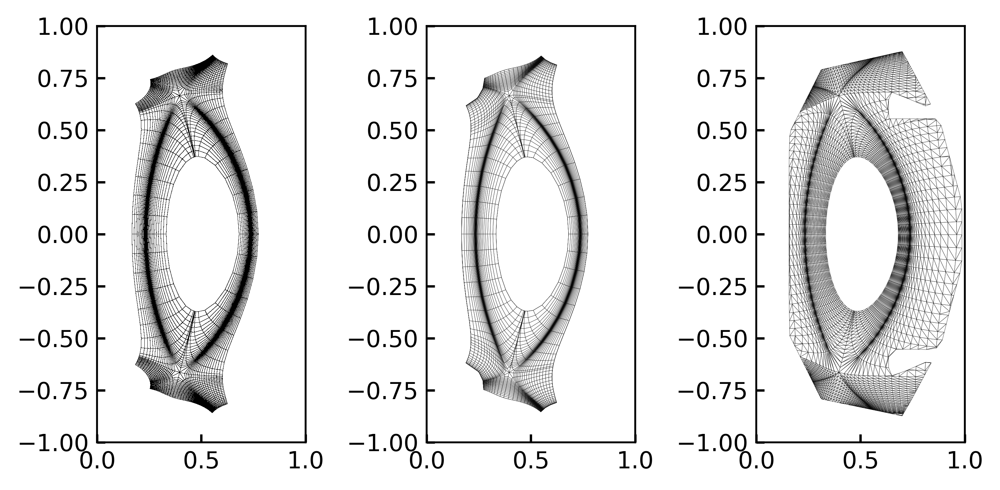

In [11]:
fig, axes = plt.subplots(1,3,  figsize = (6,3), dpi = 500)


ds = cs["afnE_mfp1"].ds.isel(t=-1, x = slice(2,-2))

ds["Te"].bout.polygon(ax = axes[0], 
                      add_colorbar = False, separatrix = False, grid_only = True,
                      linecolor = "k", linewidth = 0.01)

SOLPScase(solpscases["tightwall_2e19"]).plot_2d(ax = axes[1], param = "Dense", separatrix = False, linewidth = 0.1, grid_only = True)
SOLEDGEcase(path = soledgecases["widewall_2e19"]).plot_2d(fig = fig, ax = axes[2], param = "Dense", separatrix = False, linewidth = 0.1, grid_only = True)

for ax in axes:
    ax.grid(False)
    ax.set_xlim(-0.0, 1)
    ax.set_ylim(-1,1)
    ax.set_xlabel("")
    ax.set_title("")
    ax.set_ylabel("")
fig.tight_layout()

# fig.savefig("grids.svg", format = "svg")

## Grid sizes

In [27]:
pol_out = slc_tight.get_1d_poloidal_data(["Dense"], theta_line = 0)
pol_in = slc_tight.get_1d_poloidal_data(["Dense"], theta_line = 180)
# fig, ax = plt.subplots()
# ax.scatter(pol_out["R"], pol_out["Z"])
# ax.scatter(pol_in["R"], pol_in["Z"])
print(f"SOLEDGE2D:")
print(f"Poloidal count: {len(pol_out) + len(pol_in)}")
rad_out = slc_tight.get_1d_radial_data(["Dense"])
print(f"Radial count: {len(rad_out)}")
ax.set_aspect("equal")

print(f"Hermes-3:")
m = casestore["base"].ds.metadata
print(f"Poloidal count: {m['nyg']}")
print(f"Radial count: {m['nxg'] - m['MXG']*2}")

SOLEDGE2D:
Poloidal count: 123
Radial count: 27
Hermes-3:
Poloidal count: 108
Radial count: 36


## Puff locations

3e+16 1e+18


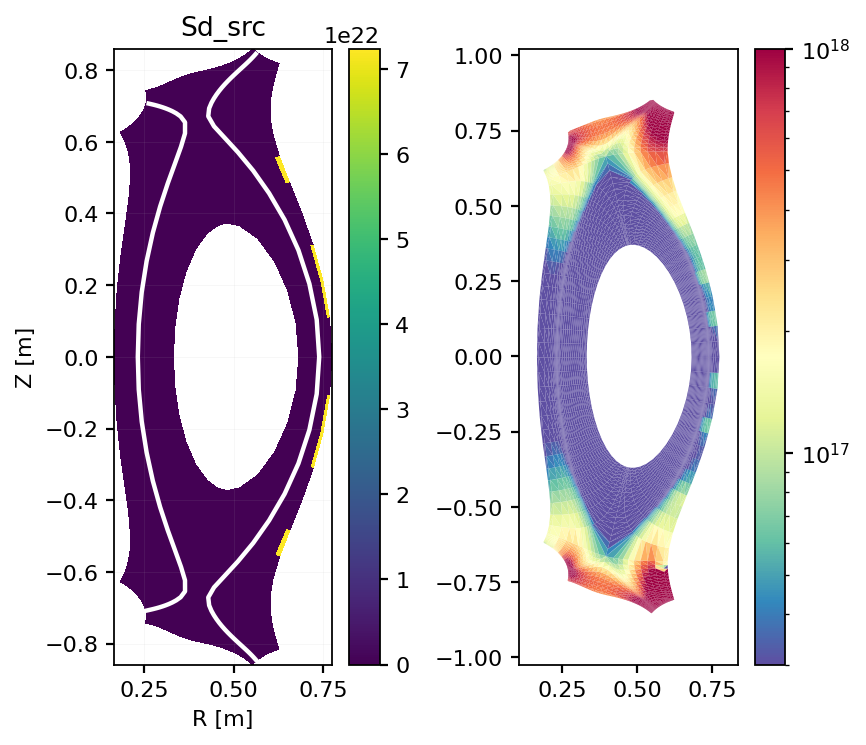

In [43]:
ds = casestore["base"].ds.isel(t=-1, x = slice(2,-2))
fig, axes = plt.subplots(1,2, dpi = 160)
ds["Sd_src"].bout.polygon(ax = axes[0])
slc_tight.plot_2d(fig = fig, ax = axes[1], param = "Nni", separatrix = False, cbar = True, vmin = 3e16, vmax = 1e18)

# Final match

## Pressure lineplots

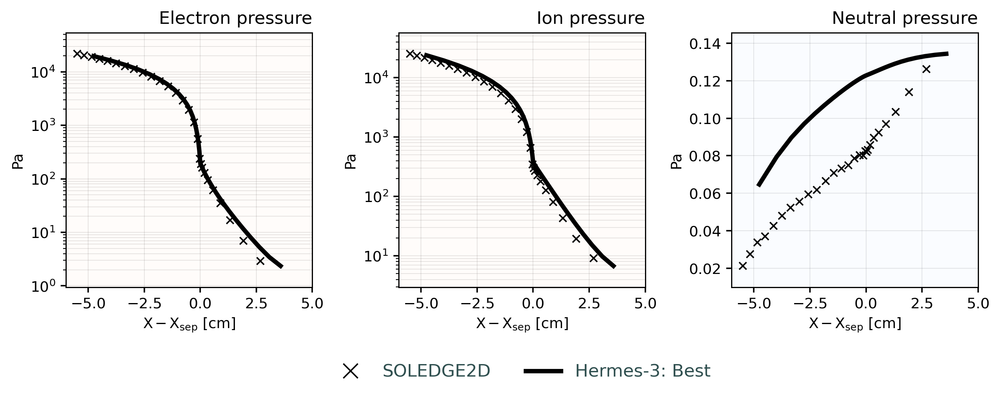

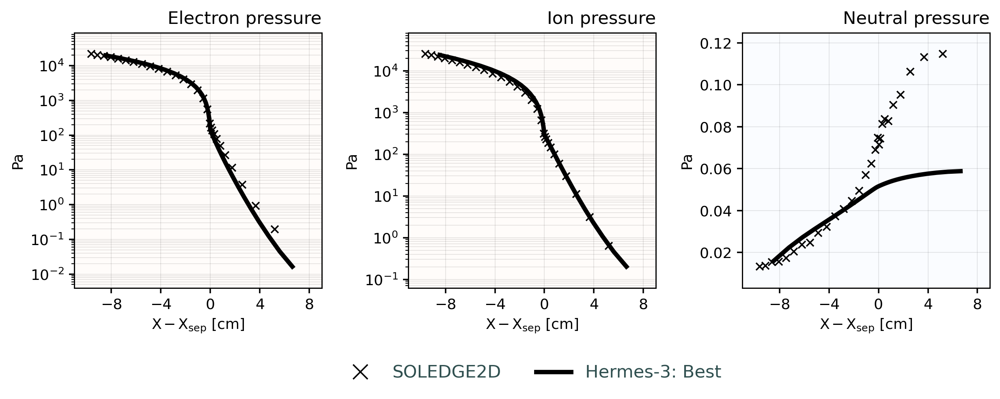

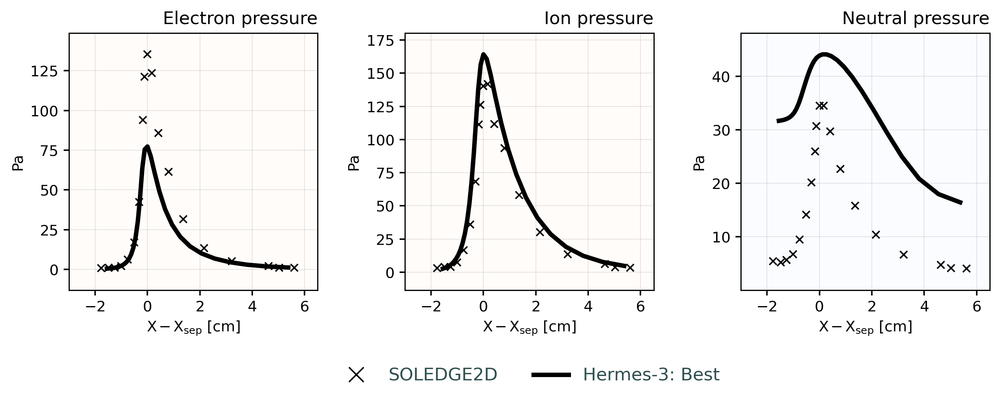

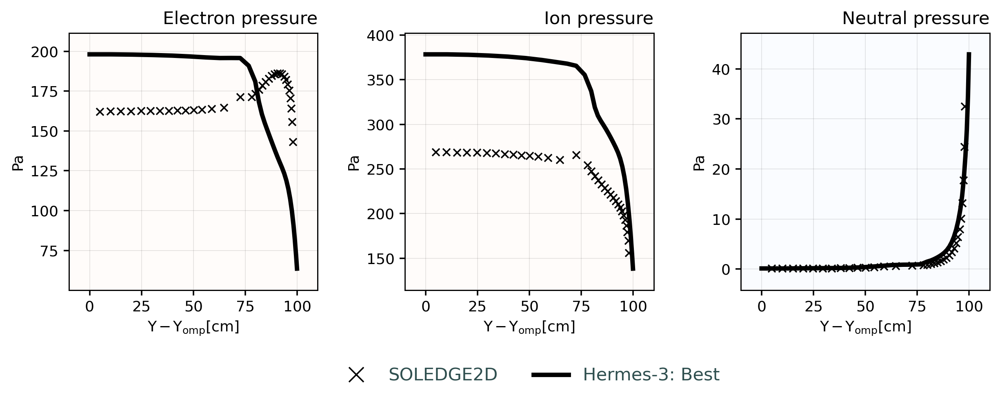

In [9]:

plt.close("all")
lineplot_compare(
    cases = { 

    "SOLEDGE2D" : dict(data=sl["tightwall_2e19"], color="black", marker = "x"),
    r"Hermes-3: Best" : dict(data=hr['afnE_mfp1_cond0.25_frec0.48'], color = "black"),

    },
    regions = ["omp", "imp", "outer_lower", "outer_fieldline"],
    # params = ["Ne", "Te", "Td+", "Na", "Ta"],
    params = ["Pe", "Pd+", "Pa"],

    mode = "log",
    dpi = 200,
    lw = 2,
    legend_nrows = 1
)

## Pressure lineplots with molecules

In [1]:
hr.keys()

NameError: name 'hr' is not defined

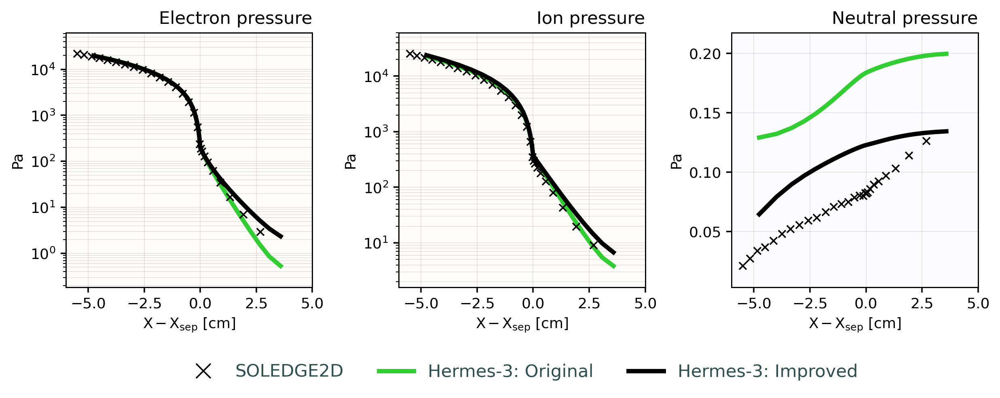

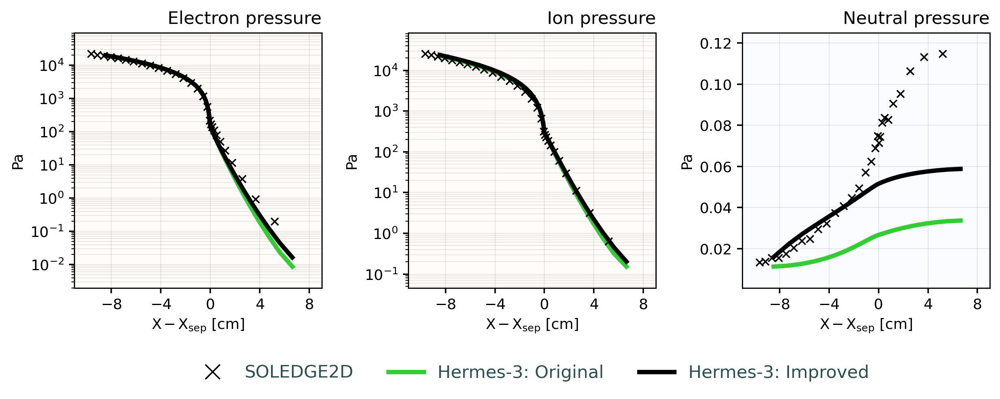

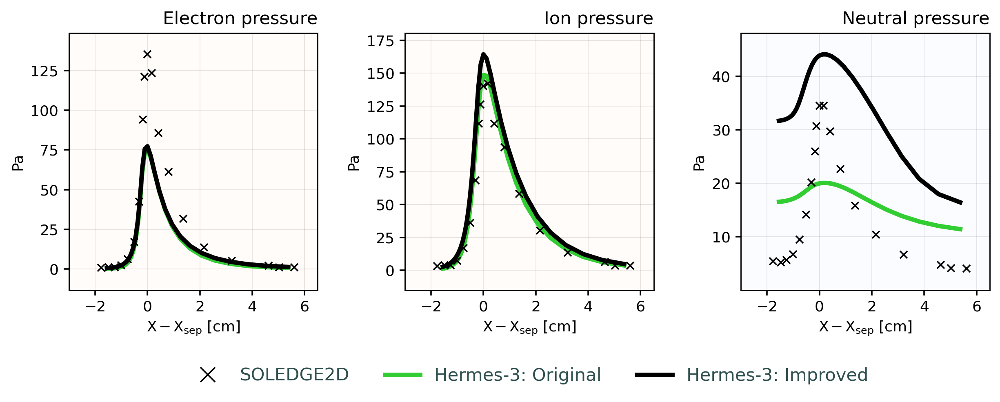

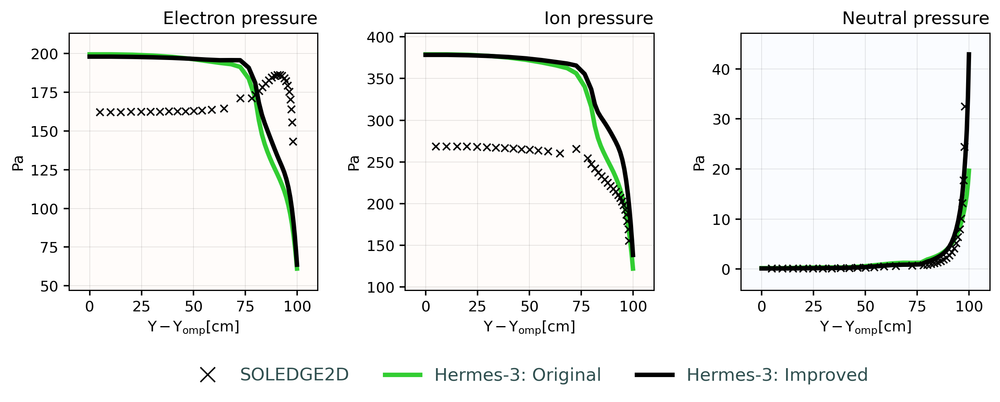

In [15]:

plt.close("all")
lineplot_compare(
    cases = { 

    "SOLEDGE2D" : dict(data=sl["tightwall_2e19"], color="black", marker = "x"),
    r"Hermes-3: Original" : dict(data=hr['base'], color = "limegreen"),
    r"Hermes-3: Improved" : dict(data=hr['afnE_mfp1_cond0.25_frec0.48'], color = "black"),

    },
    regions = ["omp", "imp", "outer_lower", "outer_fieldline"],
    # params = ["Ne", "Te", "Td+", "Na", "Ta"],
    params = ["Pe", "Pd+", "Pa"],

    mode = "log",
    dpi = 200,
    lw = 2,
    legend_nrows = 1,
    combine_molecules = False
)

In [14]:
sp.keys()

dict_keys(['base', 'noiz_core', 'gammai_2.5', 'dpuff_1e22', 'dpuff_5e21', 'no_fast_reflec', 'nsep_2e19', 'nsep_3e19', 'narrow_core', 'no_visc', '16x_mc', 'tightwall_2e19'])

In [10]:
hr.keys()

dict_keys(['base', 'esccore_edgerefl_decaylength', 'frec', 'pump', 'frec_tune', 'afnD_mfp1', 'afnE_mfp1', 'afnE_mfp1_cond0.75', 'afnE_mfp1_cond0.5', 'afnE_mfp1_cond0.25', 'afnE_mfp1_cond0.1', 'afnE_mfp1_cond0.01', 'afnE_mfp1_cond0.25_frec0.00', 'afnE_mfp1_cond0.25_frec0.48', 'afnE_mfp1_cond0.25_frec0.68', 'afnE_mfp1_cond0.25_frec0.48_nonrefl', 'afnE_mfp1_1e19'])

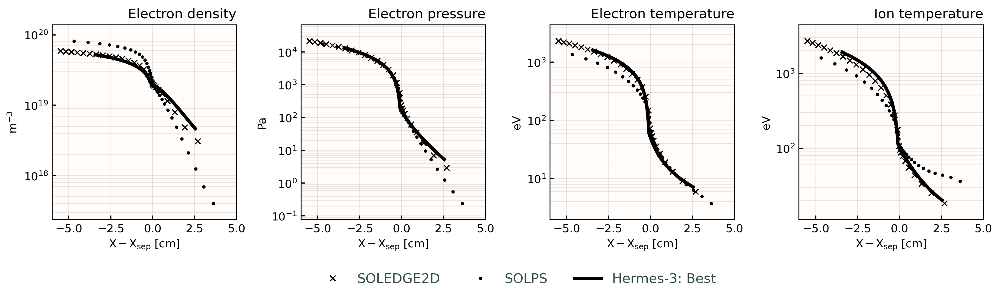

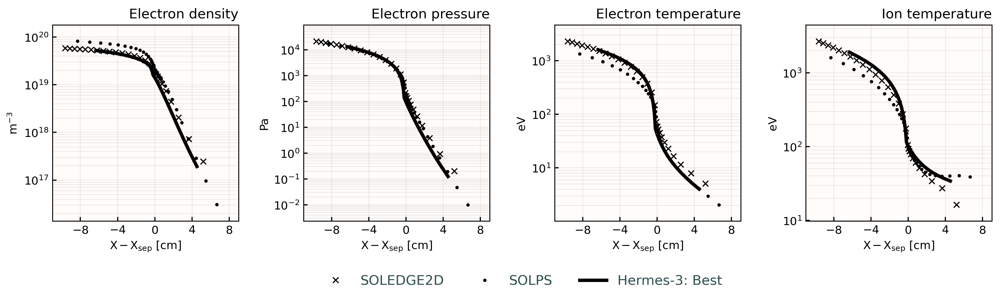

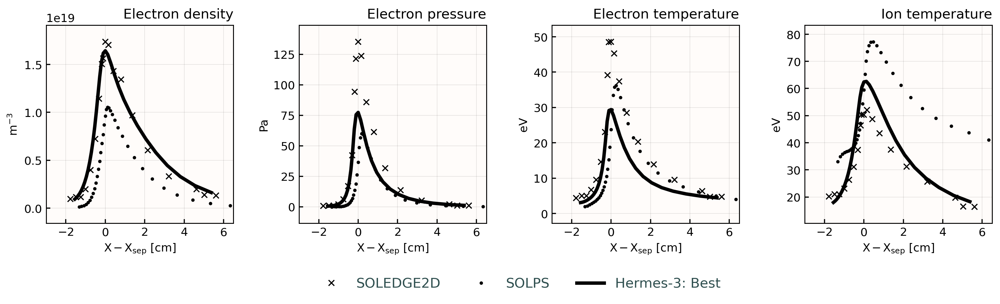

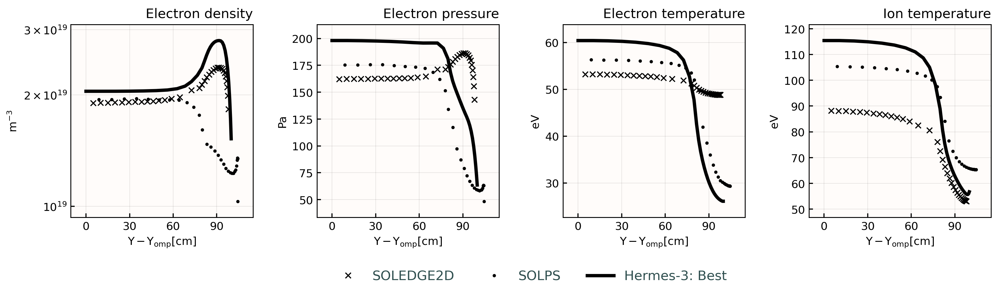

In [25]:

plt.close("all")
lineplot_compare(
    cases = { 

    "SOLEDGE2D" : dict(data=sl["tightwall_2e19"], color="black", marker = "x"),
    "SOLPS" : dict(data=sp["tightwall_2e19"], color="black", marker = "o"),
    r"Hermes-3: Best" : dict(data=hr['afnE_mfp1_cond0.25_frec0.48'], color = "black"),

    },
    regions = ["omp", "imp", "outer_lower", "outer_fieldline"],
    params = ["Ne", "Pe", "Te", "Td+"],
    # params = ["Pe", "Pd+", "Pa"],

    mode = "log",
    dpi = 200,
    lw = 2,
    legend_nrows = 1
)

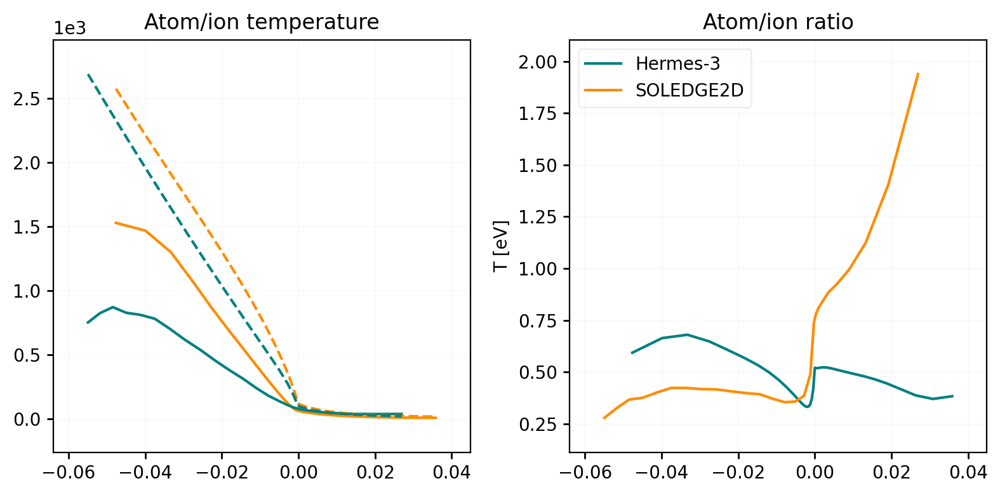

In [39]:
fig, axes = plt.subplots(1,2, figsize = (8,4), dpi = 200)

hrd = hr["afnE_mfp1_cond0.25_frec0.48"].regions["omp"]
sld = sl["tightwall_2e19"].regions["omp"]



ax = axes[0]
ax.plot(hrd.index, hrd["Ta"], label = "Hermes-3 neutrals", c = "darkorange", ls = "-")
ax.plot(sld.index, sld["Ta"], label = "SOLEDGE neutrals", c = "teal", ls = "-")

ax.plot(hrd.index, hrd["Td+"], label = "Hermes-3 ions", c = "darkorange", ls = "--")
ax.plot(sld.index, sld["Td+"], label = "SOLEDGE ions", c = "teal", ls = "--")
ax.set_title("Atom/ion temperature")

ax = axes[1]
ax.plot(hrd.index, hrd["Ta"] / hrd["Td+"], label = "Hermes-3")
ax.plot(sld.index, sld["Ta"] / sld["Td+"], label = "SOLEDGE2D")
ax.set_title("Atom/ion ratio")
ax.set_ylabel("T [eV]")
ax.legend()

fig.tight_layout()

In [59]:
casestore.keys()

dict_keys(['base', 'esccore_edgerefl_decaylength', 'frec', 'pump', 'frec_tune', 'afnD_mfp1', 'afnE_mfp1', 'afnE_mfp1_cond0.75', 'afnE_mfp1_cond0.5', 'afnE_mfp1_cond0.25', 'afnE_mfp1_cond0.1', 'afnE_mfp1_cond0.01', 'afnE_mfp1_cond0.25_frec0.00', 'afnE_mfp1_cond0.25_frec0.48', 'afnE_mfp1_cond0.25_frec0.68', 'afnE_mfp1_cond0.25_frec0.48_nonrefl', 'afnE_mfp1_1e19'])

c:\Users\mikek\OneDrive\Project\python-packages\soledge\routines\h5_routines.py:65: FutureWarning: In the future `np.str` will be defined as the corresponding NumPy scalar.
  Data = Data.astype(np.str)
c:\Users\mikek\OneDrive\Project\python-packages\soledge\routines\h5_routines.py:65: FutureWarning: In the future `np.str` will be defined as the corresponding NumPy scalar.
  Data = Data.astype(np.str)


0 10


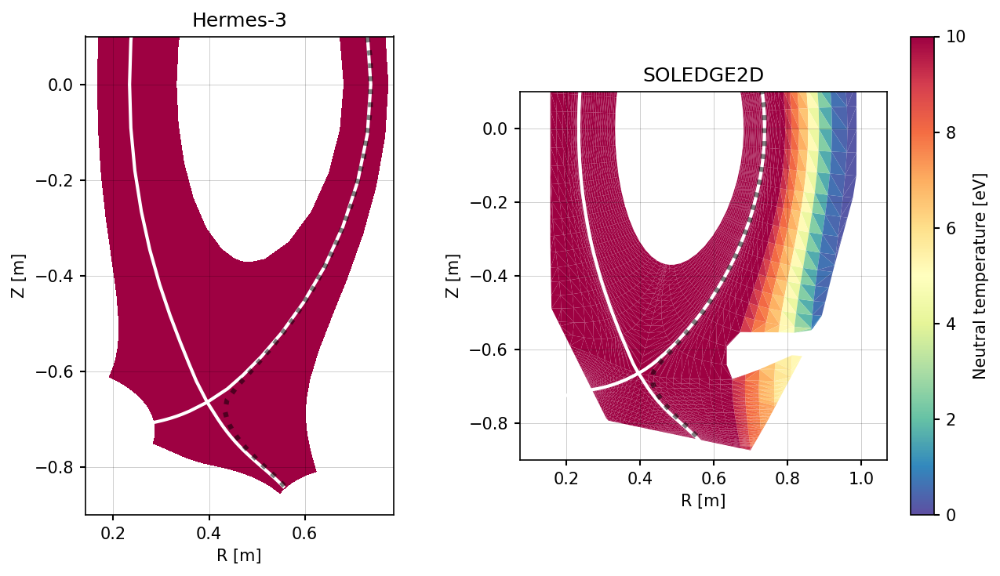

In [63]:

slc_wide = SOLEDGEcase(path = soledgecases["widewall_2e19"])

fig, axes = plt.subplots(1,2, dpi = 150, figsize = (9,5))

# vmin = 1e16
# vmax = 5e19
vmin = 0
vmax = 10
logscale = False

# slc = SOLEDGEcase(path = soledgecases["widewall_2e19"])
# slc.plot_2d(param = "TotRadi", fig=fig, ax=axes[0], cbar = False, logscale = True, vmin = vmin, vmax = vmax, cmap = "Spectral_r")
# axes[0].set_title("SOLEDGE2D: Full grid")
# axes[0].set_xlim(0.15, 1.0)
# ds = casestore["afnE_mfp1_cond0.01"].ds.isel(t=-1,  theta=slice(2,-2))
ds = casestore["afnE_mfp1_cond0.25_frec0.48"].ds.isel(t=-1,  theta=slice(2,-2))
data = ds["Td"] / ds["Td+"]
data = ds["Td+"]
# data = ds["Nd"]
data.hermesm.clean_guards().hermesm.polygon(ax = axes[0], cmap = "Spectral_r", vmin = vmin, vmax = vmax, logscale = logscale, antialias = False, add_colorbar = False, colorbar_label = "Neutral temperature [eV]")
axes[0].set_title("Hermes-3")

# slc = SOLEDGEcase(path = soledgecases["tightwall_2e19"])
slc = SOLEDGEcase(path = soledgecases["widewall_2e19"])

Ti = slc._get_2d_on_tri("Tempi")
Ta = slc._get_2d_on_tri("Tmi")
data = Ta/Ti
data = Ti
# data = slc._get_2d_on_tri("Nni")

# data = slc._get_2d_on_tri("Nni")
slc.plot_2d(data = data, fig=fig, ax=axes[1], cbar = True, cbar_label = "Neutral temperature [eV]", logscale = logscale, vmin = vmin, vmax = vmax, cmap = "Spectral_r")
axes[1].set_title("SOLEDGE2D")


fline = ds.isel(x=22, theta = slice(70,None))

for ax in axes:
    ax.plot(fline["R"], fline["Z"], c= "k", lw = 3, ls = ":", alpha = 0.5)


for ax in axes:
    ax.set_ylim(-0.9, 0.1)
    ax.grid(alpha = 0.3, c = "k")
    ax.set_xlabel("R [m]")
    ax.set_ylabel("Z [m]")
fig.tight_layout()

## NT lineplots

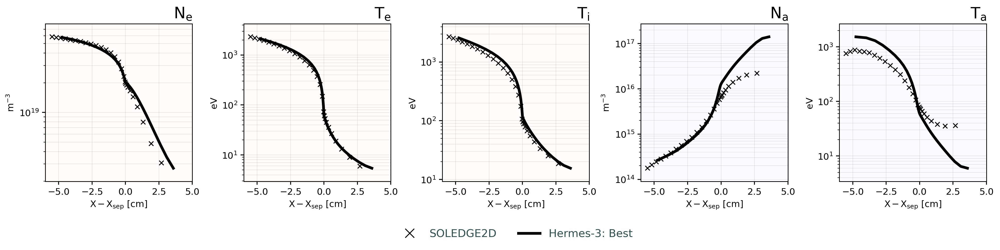

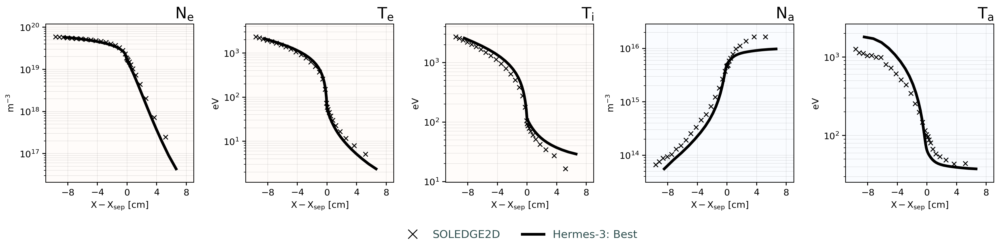

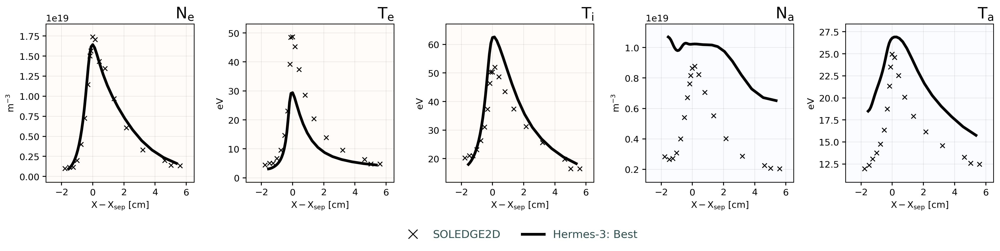

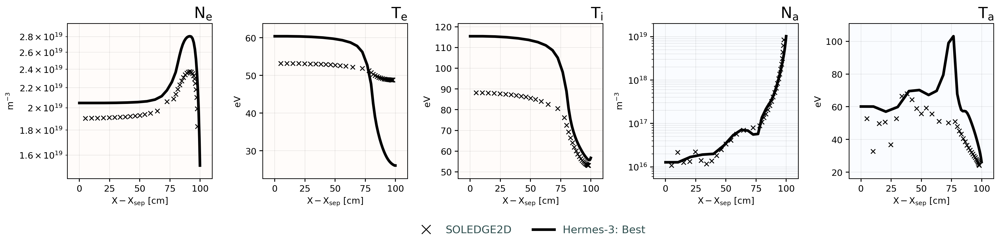

In [10]:

plt.close("all")
lineplot_compare(
    cases = { 

    "SOLEDGE2D" : dict(data=sl["tightwall_2e19"], color="black", marker = "x"),
    r"Hermes-3: Best" : dict(data=hr['afnE_mfp1_cond0.25_frec0.48'], color = "black"),

    },
    regions = ["omp", "imp", "outer_lower", "outer_fieldline"],
    params = ["Ne", "Te", "Td+", "Na", "Ta"],
    # params = ["Pe", "Pd+", "Pa"],

    mode = "log",
    dpi = 200,
    lw = 2,
    legend_nrows = 1
)

# Molecule investigation

## Poloidal plots

In [29]:
casestore.keys()

dict_keys(['base', 'esccore_edgerefl_decaylength', 'frec', 'pump', 'frec_tune', 'afnD_mfp1', 'afnE_mfp1', 'afnE_mfp1_cond0.75', 'afnE_mfp1_cond0.5', 'afnE_mfp1_cond0.25', 'afnE_mfp1_cond0.25_frec0.00', 'afnE_mfp1_cond0.25_frec0.48', 'afnE_mfp1_cond0.25_frec0.68', 'afnE_mfp1_cond0.25_frec0.48_nonrefl'])

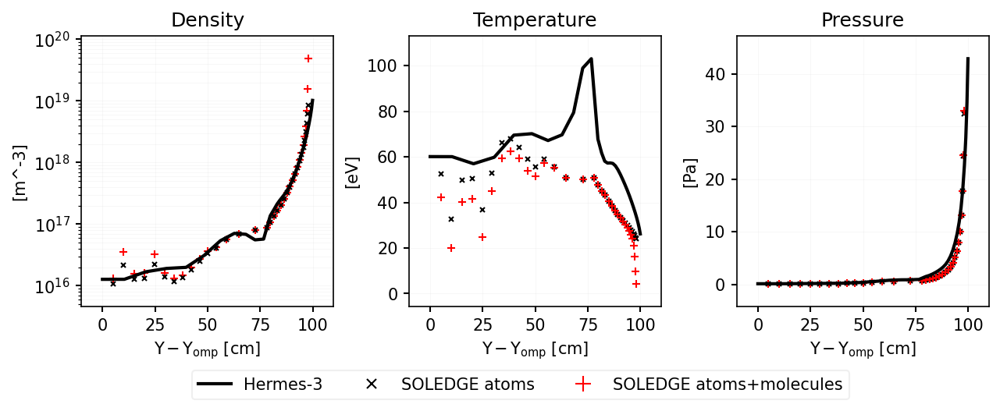

In [48]:
import sdtools.general.plotstyle
fig, axes = plt.subplots(1,3, figsize=(10,3), dpi = 150)
fig.subplots_adjust(wspace=0.3)
region = "outer_fieldline"

hcase = "afnE_mfp1_cond0.25_frec0.48"
# hcase = "afnE_mfp1_cond0.25_frec0.68"

hermes = hr[hcase].regions[region]
sol = sl["tightwall_2e19"].regions[region].copy()
# sol = sol.query("index <0.05 and index > -0.02")
sol.index *= 100

hstyle = dict(lw = 2, c = "black")
atomstyle = dict(lw=0, marker = "x", c = "black", ms = 3, markeredgewidth = 1)
molstyle = dict(lw=0, marker = "d", c = "deeppink", ms = 3)
effstyle = dict(lw=0, marker = "+", c = "red", ms = 5, markeredgewidth = 1)

lw = 2
ax = axes[0]

ax.plot(hermes.index*100, hermes["Na"], label = "Hermes-3", zorder = 100, **hstyle)
ax.plot(sol.index, sol["Na"] + 2*sol["Nm"], **effstyle)
ax.plot(sol.index, sol["Na"], label = "SOLEDGE atoms", **atomstyle)
# ax.plot(sol.index, sol["Nm"], label = "SOLEDGE molecules", **molstyle)
ax.set_ylabel("[m^-3]")
ax.set_title("Density")
ax.set_yscale("log")

ax = axes[1]
ax.plot(hermes.index*100, hermes["Ta"], zorder = 100, **hstyle)
ax.plot(sol.index, sol["Ta"], **atomstyle)
# ax.plot(sol.index, sol["Tm"], **molstyle)
weighted_temp = ((sol["Ta"] * sol["Na"]) + (sol["Tm"] * sol["Nm"]*2)) / (sol["Na"] + sol["Nm"]*2)
ax.plot(sol.index, weighted_temp, label = "SOLEDGE atoms+molecules", **effstyle)
ax.set_ylabel("[eV]")
ax.set_title("Temperature")

ax = axes[2]
ax.plot(hermes.index*100, hermes["Pa"], zorder = 100, **hstyle)
ax.plot(sol.index,  sol["Na"] * sol["Ta"]*constants("q_e"), **atomstyle)
# ax.plot(sol.index, sol["Nm"] * sol["Tm"]*constants("q_e"), **molstyle)
weighted_p = ((sol["Ta"]*constants("q_e") * sol["Na"]) + (sol["Tm"]*constants("q_e") * sol["Nm"]*2))
ax.plot(sol.index, weighted_p, **effstyle)
ax.set_ylabel("[Pa]")
ax.set_title("Pressure")

fig.legend(loc = "upper center", bbox_to_anchor = (0.5, -0.05), ncols = 3)
for ax in axes:
    
    ax.set_xlabel("$Y-Y_{omp}$ [cm]")
    # ax.set_yscale("log")

Text(0.5, 0, '$l_{pol}$ [m]')

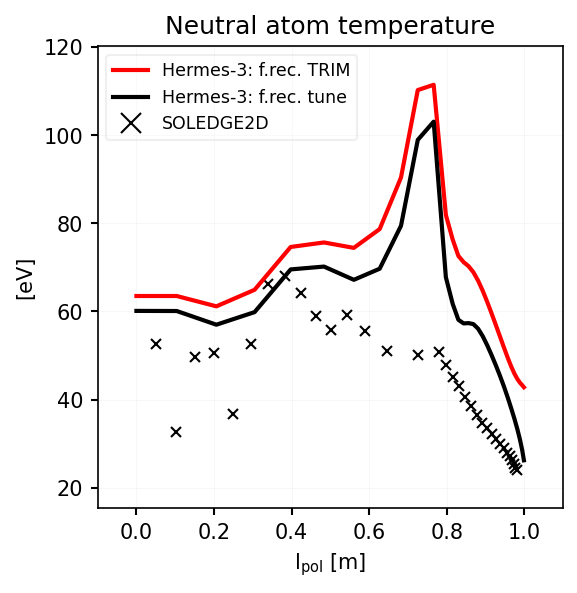

In [46]:
import sdtools.general.plotstyle
fig, ax = plt.subplots(figsize=(4,4), dpi = 150)
fig.subplots_adjust(wspace=0.3)
region = "outer_fieldline"

hcase = "afnE_mfp1_cond0.25_frec0.48"
# hcase = "afnE_mfp1_cond0.25_frec0.68"

hermes = hr[hcase].regions[region]


hstyle = dict(lw = 2)
atomstyle = dict(lw=0, marker = "x", c = "black", ms = 5, markeredgewidth = 1)
molstyle = dict(lw=0, marker = "d", c = "deeppink", ms = 3)
effstyle = dict(lw=0, marker = "+", c = "red", ms = 5, markeredgewidth = 1)

lw = 2

hcase = "afnE_mfp1_cond0.25_frec0.68"
hermes = hr[hcase].regions[region]
ax.plot(hermes.index, hermes["Ta"], zorder = 100, **hstyle, c = "r", label = "Hermes-3: f.rec. TRIM")

hcase = "afnE_mfp1_cond0.25_frec0.48"
hermes = hr[hcase].regions[region]
ax.plot(hermes.index, hermes["Ta"], zorder = 100, **hstyle, c = "k", label = "Hermes-3: f.rec. tune")



sol = sl["tightwall_2e19"].regions[region].copy()
# sol = sol.query("index <0.05 and index > -0.02")
ax.plot(sol.index, sol["Ta"], **atomstyle, label = "SOLEDGE2D")
# ax.plot(sol.index, sol["Tm"], **molstyle)
# weighted_temp = ((sol["Ta"] * sol["Na"]) + (sol["Tm"] * sol["Nm"]*2)) / (sol["Na"] + sol["Nm"]*2)
# ax.plot(sol.index, weighted_temp, label = "SOLEDGE2D", **effstyle)
ax.set_ylabel("[eV]")
ax.set_title("Neutral atom temperature")


ax.legend(loc = "best", fontsize = "small")
# for ax in axes:
    
ax.set_xlabel("$l_{pol}$ [m]")
    # ax.set_yscale("log")

### Radial plots on OMP and target

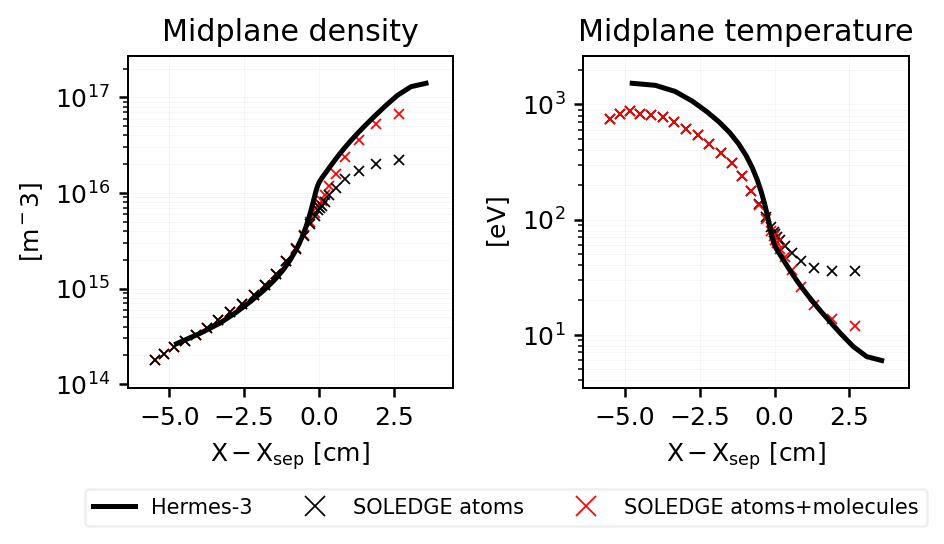

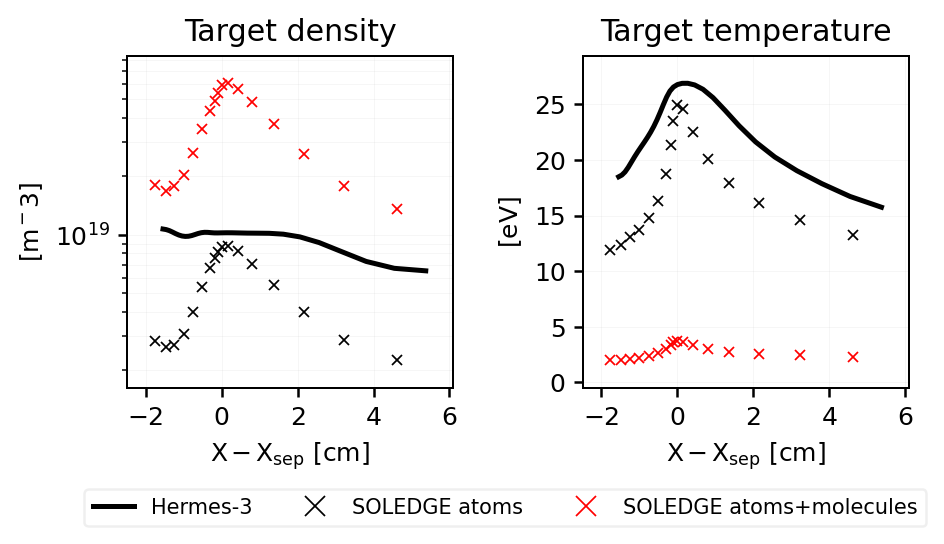

In [28]:
import sdtools.general.plotstyle


# hcase = "afnE_mfp1_cond0.25_frec0.48"
hcase = "afnE_mfp1_cond0.25_frec0.48"
for region in ["omp", "outer_lower"]:

    region_name = {"omp":"Midplane", "outer_lower":"Target"}[region]
    
    fig, axes = plt.subplots(1,2, figsize=(7*0.8,3*0.8), dpi = 180)
    fig.subplots_adjust(wspace=0.4)

    hermes = hr[hcase].regions[region]
    sol = sl["tightwall_2e19"].regions[region].copy()
    
    if "outer_lower" in region:
        sol = sol.query("index <0.05 and index > -0.02")
    sol.index *= 100

    hstyle = dict(lw = 2, c = "black")
    atomstyle = dict(lw=0, marker = "x", c = "black", ms = 4, markeredgewidth = 0.7)
    molstyle = dict(lw=0, marker = "d", c = "deeppink", ms = 3)
    effstyle = dict(lw=0, marker = "x", c = "red", ms = 4, markeredgewidth = 0.7)

    lw = 2
    ax = axes[0]

    ax.plot(hermes.index*100, hermes["Na"], label = "Hermes-3", zorder = 100, **hstyle)
    ax.plot(sol.index, sol["Na"] + 2*sol["Nm"], **effstyle)
    ax.plot(sol.index, sol["Na"], label = "SOLEDGE atoms", **atomstyle)
    # ax.plot(sol.index, sol["Nm"], label = "SOLEDGE molecules", **molstyle)
    ax.set_ylabel("[$m^-3$]")
    ax.set_title(f"{region_name} density")
    ax.set_yscale("log")

    ax = axes[1]
    ax.plot(hermes.index*100, hermes["Ta"], zorder = 100, **hstyle)
    ax.plot(sol.index, sol["Ta"], **atomstyle)
    # ax.plot(sol.index, sol["Tm"], **molstyle)
    weighted_temp = ((sol["Ta"] * sol["Na"]) + (sol["Tm"] * sol["Nm"]*2)) / (sol["Na"] + sol["Nm"]*2)
    ax.plot(sol.index, weighted_temp, label = "SOLEDGE atoms+molecules", **effstyle)
    ax.set_ylabel("[$eV$]")
    ax.set_title(f"{region_name} temperature")

    # ax = axes[2]
    # ax.plot(hermes.index*100, hermes["Pa"], zorder = 100, **hstyle)
    # ax.plot(sol.index,  sol["Na"] * sol["Ta"]*constants("q_e"), **atomstyle)
    # # ax.plot(sol.index, sol["Nm"] * sol["Tm"]*constants("q_e"), **molstyle)
    # weighted_p = ((sol["Ta"]*constants("q_e") * sol["Na"]) + (sol["Tm"]*constants("q_e") * sol["Nm"]*2))
    # ax.plot(sol.index, weighted_p, **effstyle)
    # ax.set_ylabel("[Pa]")
    # ax.set_title("Pressure")

    fig.legend(loc = "upper center", bbox_to_anchor = (0.5, -0.1), ncols = 3, fontsize = "small")
    for ax in axes:
        
        ax.set_xlabel("$X-X_{sep}$ [cm]")
        ax.xaxis.set_major_locator(mpl.ticker.MaxNLocator(min_n_ticks=3, nbins=5))
        if "outer_lower" not in region:
            ax.set_yscale("log")
            
    # fig.tight_layout()

c:\Users\mikek\OneDrive\Project\python-packages\soledge\routines\h5_routines.py:65: FutureWarning: In the future `np.str` will be defined as the corresponding NumPy scalar.
  Data = Data.astype(np.str)


0 100


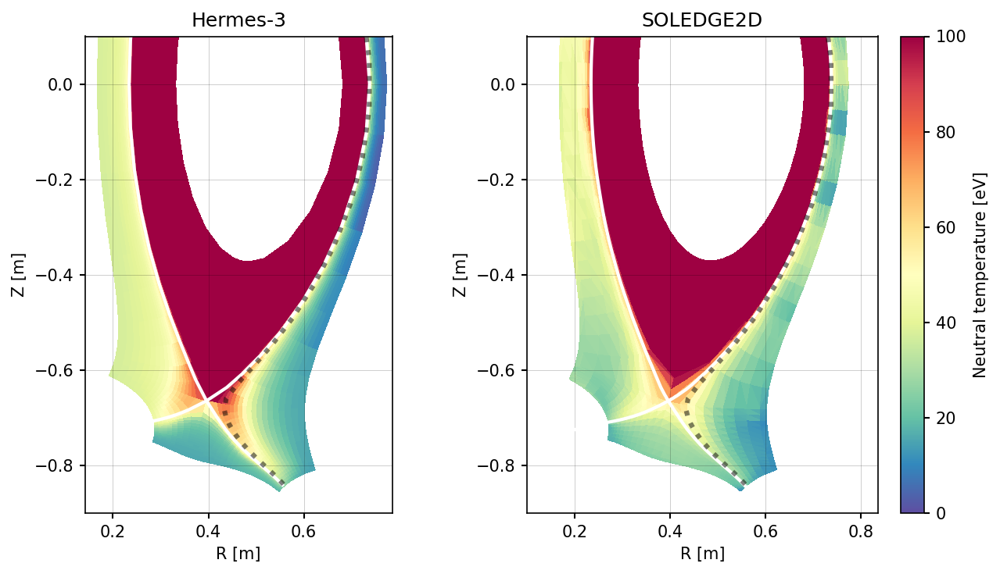

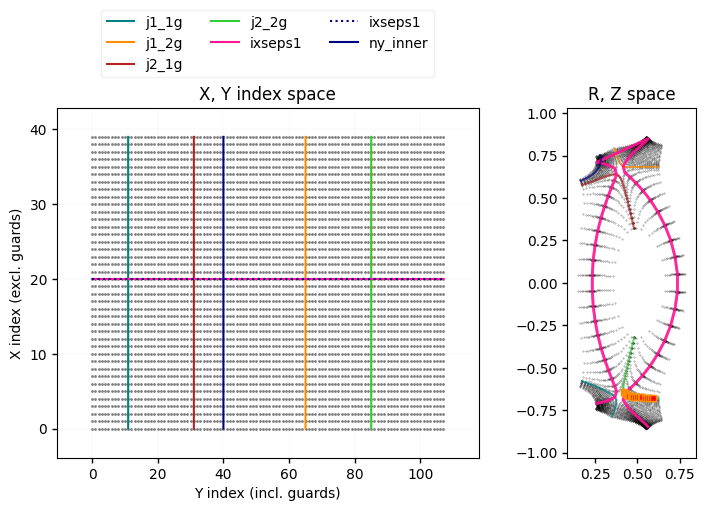

In [47]:
plot_selection(ds, ds.isel(x = slice(19, -2), theta=85))

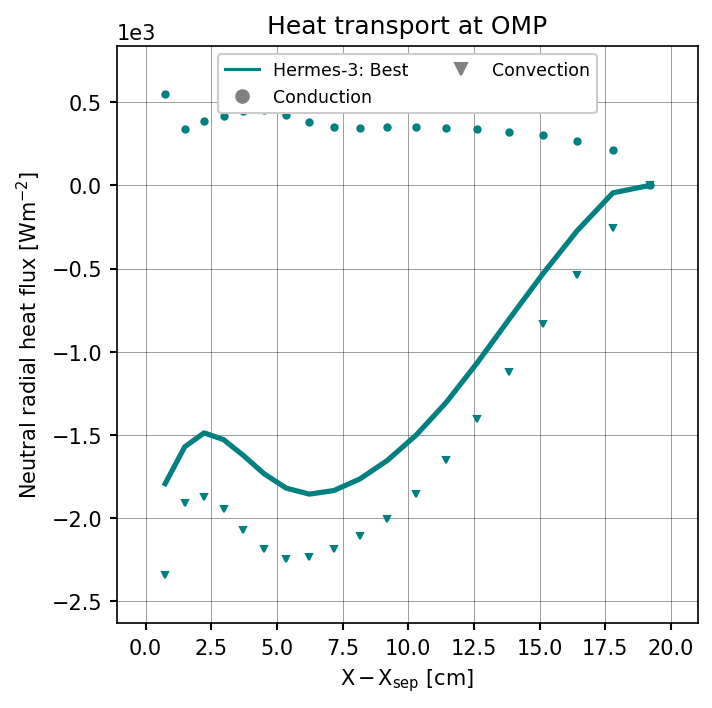

In [50]:
fig, ax = plt.subplots(figsize = (5,5), dpi = 150)

colors = ["teal", "darkorange", "firebrick", "limegreen", "mediumblue", "darkorchid", "deeppink", 
                                                   "#1E90FF", "forestgreen", "#4169e1", "darkgoldenrod", "#9370db", "crimson", "#2f4f4f" ]

cases = ["afnE_mfp1_cond0.25_frec0.48"]
labels = ["Hermes-3: Best"]

for i, case in enumerate(cases):
    
    ds = casestore[case].ds.isel(t=-1)
    m = ds.metadata

    
    # omp = ds.hermesm.select_region("outer_midplane_a").isel(x=slice(2,-2))
    # dist = (omp["R"] - omp["R"][ds.metadata["ixseps1"]])
    omp = ds.isel(theta=85, x = slice(19,-2))
    
    dist = np.cumsum(omp["dr"].values)
    ax.plot(dist*100, omp["hf_perp_diff_R_d"] / (omp["dy"]*omp["dz"]), color = colors[i],  lw = 0, ms = 3, marker = "o")
    ax.plot(dist*100, omp["hf_perp_conv_R_d"] / (omp["dy"]*omp["dz"]),  color = colors[i],  lw = 0, ms = 3, marker = "v")
    ax.plot(dist*100, omp["hf_perp_tot_R_d"] / (omp["dy"]*omp["dz"]),  color = colors[i], ls = "-", lw = 2.5)

# SOLPS
# ax.plot(sp["nsep_2e19"].regions["omp"].index*100, sp["nsep_2e19"].regions["omp"]["pfluxa3da"] * -1, label = "SOLPS wide wall (lo res)", color = "black", lw=0, marker = "o", ms = 3)
# ax.plot(sp["16x_mc"].regions["omp"].index*100, sp["16x_mc"].regions["omp"]["pefluxa3da"] * -1, label = "SOLPS wide wall (hi res)", color = "black", lw=0, marker = "o", ms = 3)

ax.set_ylabel("Neutral radial heat flux $[Wm^{-2}]$")
ax.set_xlabel("$X - X_{sep}$ [cm]")

# ax.set_xlim(-0.07*100, 0.05*100)
# ax.set_ylim(-7e3, 7e3)
ax.set_title("Heat transport at OMP")
ax.grid(color = "k", alpha = 0.6)

legend_items = []
for i, name in enumerate(cases):
    legend_items.append(mpl.lines.Line2D([0], [0], color=colors[i]))
    
legend_items.append(mpl.lines.Line2D([0], [0], color="grey", lw = 0, marker = "o", ms = 3))
legend_items.append(mpl.lines.Line2D([0], [0], color="grey", lw = 0, marker = "v", ms = 3))
ax.legend(legend_items, labels + ["Conduction", "Convection"], fontsize = "small", loc = "upper center", frameon = True, framealpha = 1,ncols = 2)

# Neutral model impact

In [14]:
casestore.keys()

dict_keys(['base', 'esccore_edgerefl_decaylength', 'frec', 'pump', 'frec_tune', 'afnD_mfp1', 'afnE_mfp1', 'afnE_mfp1_cond0.75', 'afnE_mfp1_cond0.5', 'afnE_mfp1_cond0.25', 'afnE_mfp1_cond0.25_frec0.00', 'afnE_mfp1_cond0.25_frec0.48', 'afnE_mfp1_cond0.25_frec0.68', 'afnE_mfp1_cond0.25_frec0.48_nonrefl'])

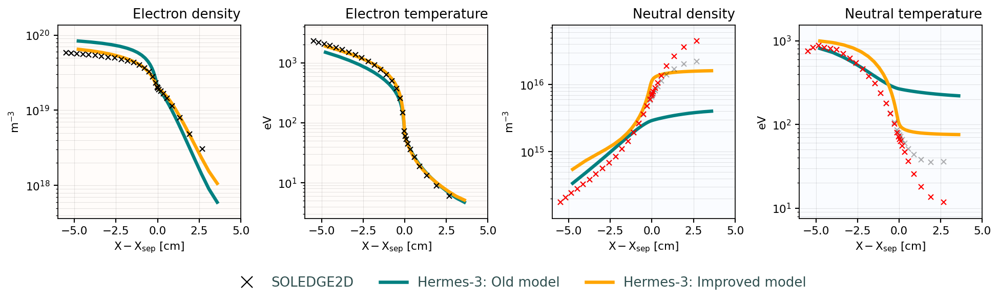

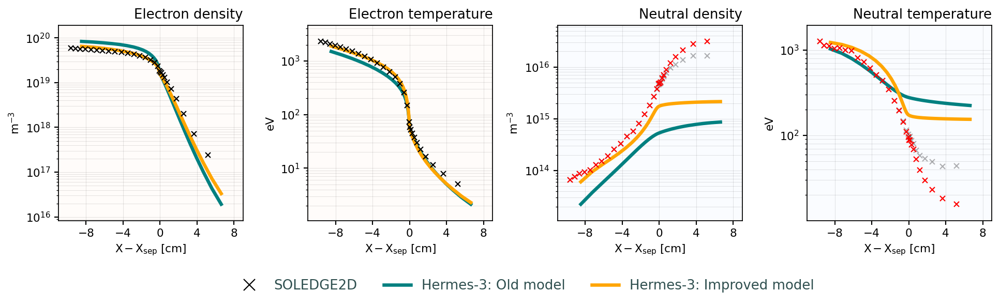

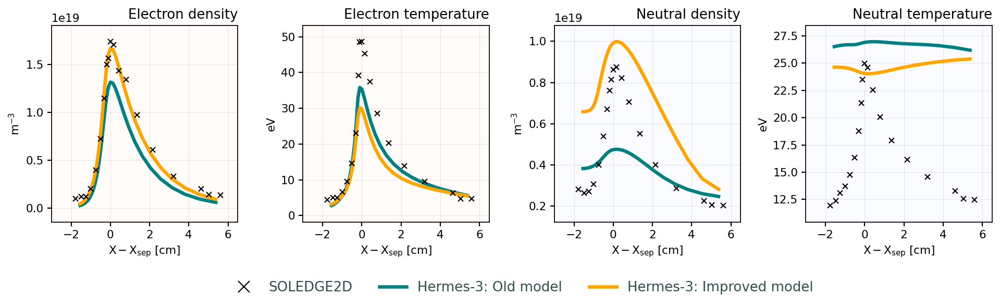

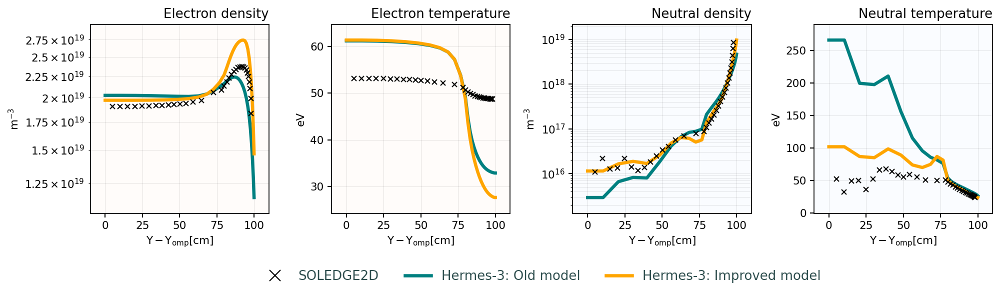

In [10]:

plt.close("all")
lineplot_compare(
    cases = { 


    "SOLEDGE2D" : dict(data=sl["tightwall_2e19"], color="black"),
    # "SOLPS: 2e19 (tight)" : dict(data=sp["nsep_3e19"], color="red"),
    
    # "Hermes-3: frec tune" : dict(data=hr['frec_tune'], color = "teal"),
    # r"Hermes-3: combined cond/conv" : dict(data=hr['afn_tunefrec'], color = "darkorange"),
    r"Hermes-3: Old model" : dict(data=hr['frec_tune'], color = "teal"),
    r"Hermes-3: Improved model" : dict(data=hr['afnE_mfp1'], color = "orange"),
    # r"Hermes-3: E" : dict(data=hr['frec'], color = "limegreen"),
    # r"Hermes-3: New, MFP=10m" : dict(data=hr['afnnew_mfp10'], color = "deeppink"),

    },
    regions = ["omp", "imp", "outer_lower", "outer_fieldline"], 
    # regions = ["outer_lower"],
    # params = ["Ne", "Te"],
    # params = ["Ne", "Te", "Td+", "Na", "Ta"],
    params = ["Ne", "Te", "Na", "Ta"],
    # params = ["Na", "Ta"],
    # params = ["Pe", "Pd+", "Pa"],
    mode = "log",
    dpi = 120,
    lw = 2,
    legend_nrows = 1,
    combine_molecules = True
)

## Particle transport

c:\Users\mikek\OneDrive\Project\python-packages\soledge\routines\h5_routines.py:65: FutureWarning: In the future `np.str` will be defined as the corresponding NumPy scalar.
  Data = Data.astype(np.str)


Text(0.5, 1.0, 'Particle transport at OMP')

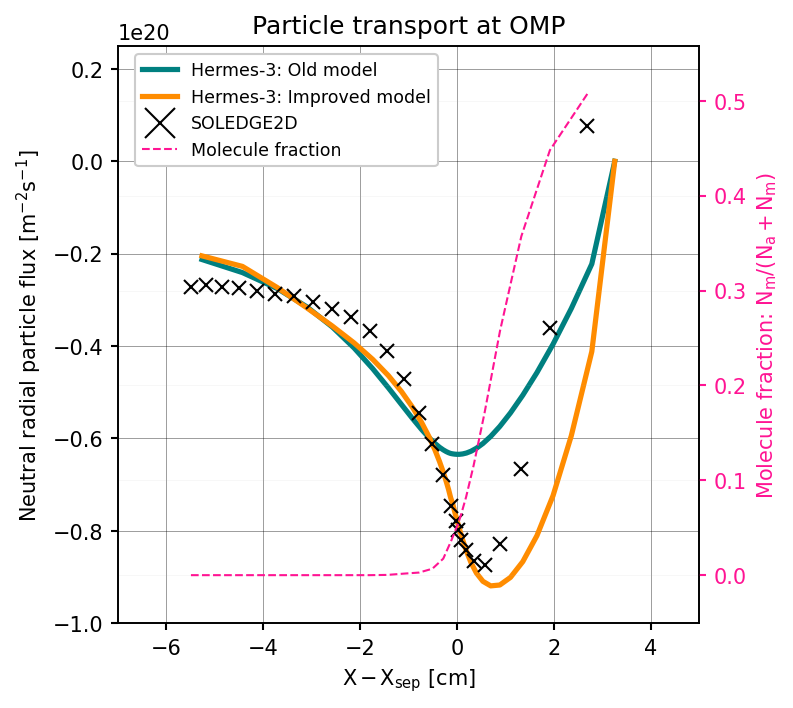

In [37]:
fig, ax = plt.subplots(figsize = (5,5), dpi = 150)
cases = ["frec_tune", "afnE_mfp1"]
labels = ["Hermes-3: Old model", "Hermes-3: Improved model"]
colors =None
# labels = ["flim=1", "flim=0.9", "flim=0.7"]

# colors = ["teal", "darkorange", "limegreen", "deeppink"]

for i, case in enumerate(cases):
    
    ds = casestore[case].ds.isel(t=-1)
    d = ds.isel(x=slice(2,-2)).sum("theta")
    omp = ds.hermesm.select_region("outer_midplane_a").isel(x=slice(2,-2))
    dist = (omp["R"] - omp["R"][ds.metadata["ixseps1"]])
    
    label = case if labels is None else labels[i]
    
    kwargs = {} if colors is None else dict(color = colors[i])
    ax.plot(dist*100, omp["pf_perp_diff_R_d"] / (omp["dy"]*omp["dz"]), label = label, lw = 2.5, **kwargs)

# SOLEDGE
slc = SOLEDGEcase(path = soledgecases["tightwall_2e19"])
df = slc.get_1d_radial_data(["vxni", "Nni", "Nmi"])
df["NVxn"] = df["vxni"] * df["Nni"]
ax.plot(df["dist"]*100, df["NVxn"], lw=0, marker = "x", ms = 7, markeredgewidth=1.0, label = "SOLEDGE2D", c = "black")

df["mfrac"] = df["Nmi"] / (df["Nni"] + df["Nmi"])

ax2 = ax.twinx()
ax2.plot(df["dist"]*100, df["mfrac"], lw = 1, c = "deeppink", ls = "--", label = "Molecule fraction")
ax2.set_ylabel("Molecule fraction: $N_{m}/(N_{a}+N_{m})$", color = "deeppink")
ax2.yaxis.label.set_color("deeppink")
ax2.tick_params(axis="y", colors = "deeppink")

ax.set_ylabel("Neutral radial particle flux $[m^{-2}s^{-1}]$")
ax.set_xlabel("$X - X_{sep}$ [cm]")
fig.legend(loc = "upper center",  bbox_to_anchor = (0.35,0.88), fontsize="small", frameon=True, framealpha = 1)
ax.set_xlim(-0.07*100, 0.05*100)
ax.set_ylim(-1.0e20, 0.25e20)

casestore.keys()
ax.grid(color = "k", alpha = 0.6)
ax.set_title("Particle transport at OMP")

## Energy transport

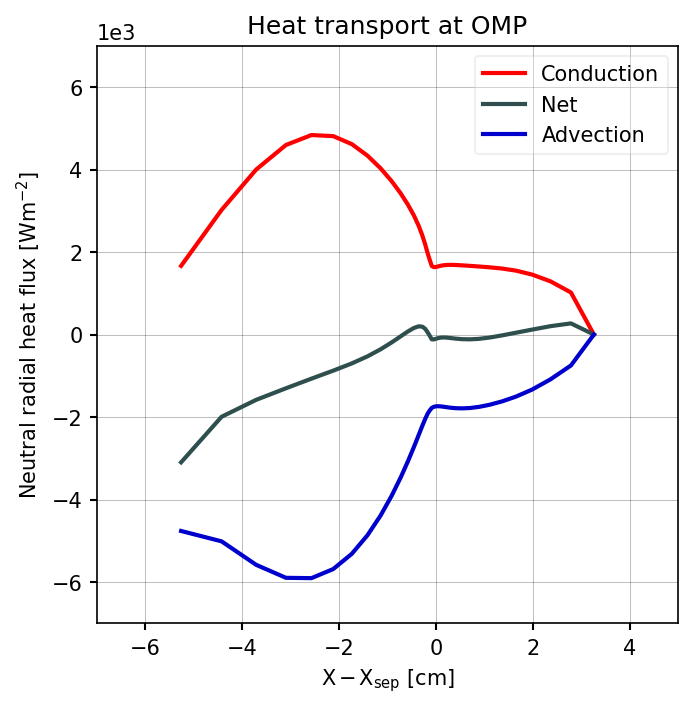

In [46]:
fig, ax = plt.subplots(figsize = (5,5), dpi = 150)

colors = ["teal", "darkorange", "firebrick", "limegreen", "mediumblue", "darkorchid", "deeppink", 
                                                   "#1E90FF", "forestgreen", "#4169e1", "darkgoldenrod", "#9370db", "crimson", "#2f4f4f" ]

cases = ["frec_tune", "afnE_mfp1"]
labels = ["Hermes-3: Old model", "Hermes-3: Improved model"]

case = "afnE_mfp1"
    
ds = casestore[case].ds.isel(t=-1)
d = ds.isel(x=slice(2,-2)).sum("theta")
omp = ds.hermesm.select_region("outer_midplane_a").isel(x=slice(2,-2))
dist = (omp["R"] - omp["R"][ds.metadata["ixseps1"]])

style = dict(lw = 2)
ax.plot(dist*100, omp["hf_perp_diff_R_d"] / (omp["dy"]*omp["dz"]), color = "red", label = "Conduction", **style)
ax.plot(dist*100, omp["hf_perp_tot_R_d"] / (omp["dy"]*omp["dz"]),  color = "darkslategrey", label = "Net", **style)
ax.plot(dist*100, omp["hf_perp_conv_R_d"] / (omp["dy"]*omp["dz"]),  color = "mediumblue",  label = "Advection", **style)


# SOLPS
# ax.plot(sp["nsep_2e19"].regions["omp"].index*100, sp["nsep_2e19"].regions["omp"]["pfluxa3da"] * -1, label = "SOLPS wide wall (lo res)", color = "black", lw=0, marker = "o", ms = 3)
# ax.plot(sp["16x_mc"].regions["omp"].index*100, sp["16x_mc"].regions["omp"]["pefluxa3da"] * -1, label = "SOLPS wide wall (hi res)", color = "black", lw=0, marker = "o", ms = 3)

ax.set_ylabel("Neutral radial heat flux $[Wm^{-2}]$")
ax.set_xlabel("$X - X_{sep}$ [cm]")

ax.set_xlim(-0.07*100, 0.05*100)
ax.set_ylim(-7e3, 7e3)
ax.set_title("Heat transport at OMP")
ax.grid(color = "k", alpha = 0.4)
ax.legend()

# legend_items = []
# for i, name in enumerate(cases):
#     legend_items.append(mpl.lines.Line2D([0], [0], color=colors[i]))
    
# legend_items.append(mpl.lines.Line2D([0], [0], color="grey", lw = 0, marker = "o", ms = 3))
# legend_items.append(mpl.lines.Line2D([0], [0], color="grey", lw = 0, marker = "v", ms = 3))
# ax.legend(legend_items, labels + ["Conduction", "Convection"], fontsize = "small", loc = "upper center", frameon = True, framealpha = 1,ncols = 2)

## Figure to illustrate core conduction/convection

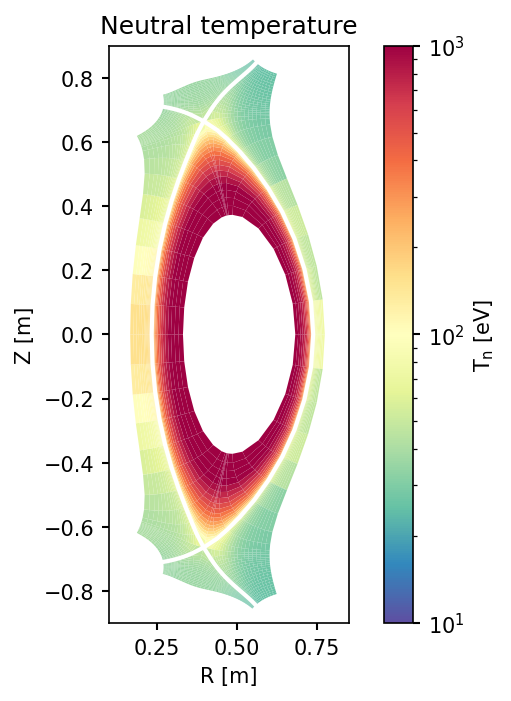

In [77]:
fig, ax = plt.subplots(dpi = 150)

ds = casestore["afnE_mfp1"].ds.isel(t=-1)

vmin = 10
vmax = 1000

ds["Td"].hermesm.clean_guards().hermesm.polygon(ax = ax, cmap = "Spectral_r", vmin = vmin, vmax = vmax, logscale = True, antialias = True, colorbar_label = "$T_{n}$ [eV]")
ax.set_title("Neutral temperature")
ax.set_xlim(0.1, 0.85)
ax.set_ylim(-0.9, 0.9)
ax.grid(False)

# Conduction limiter impact

## Original run deck

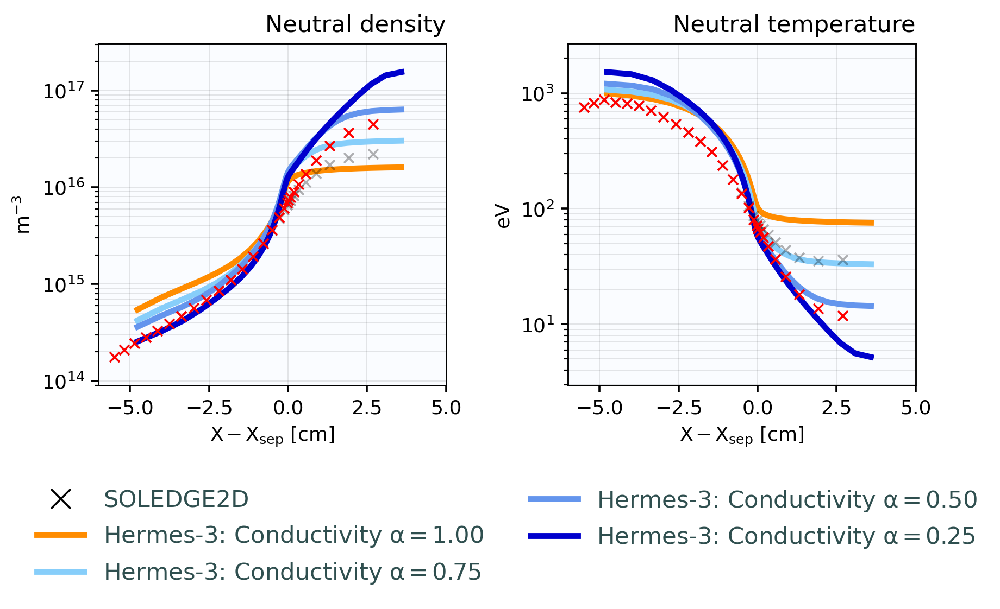

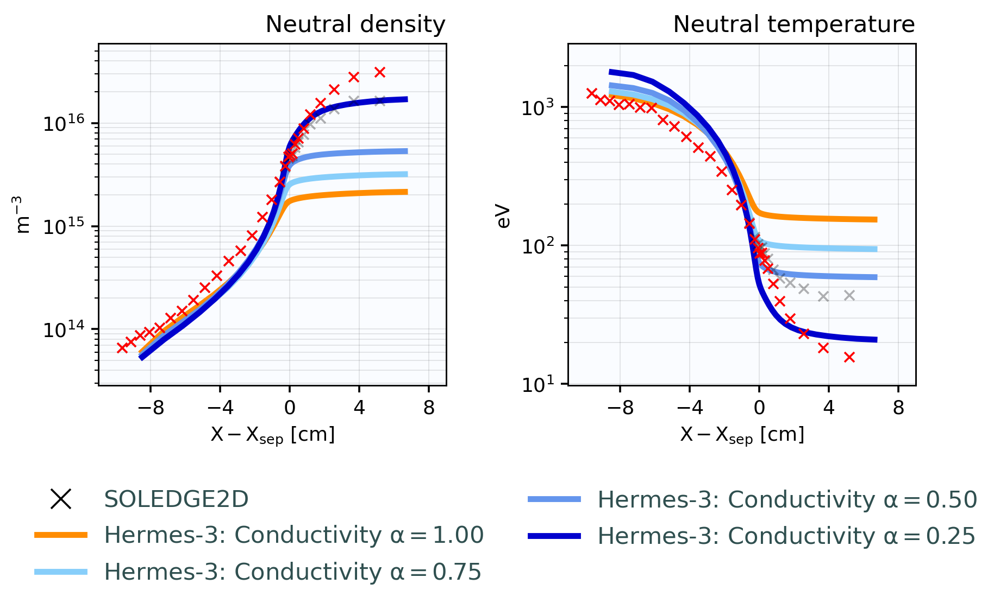

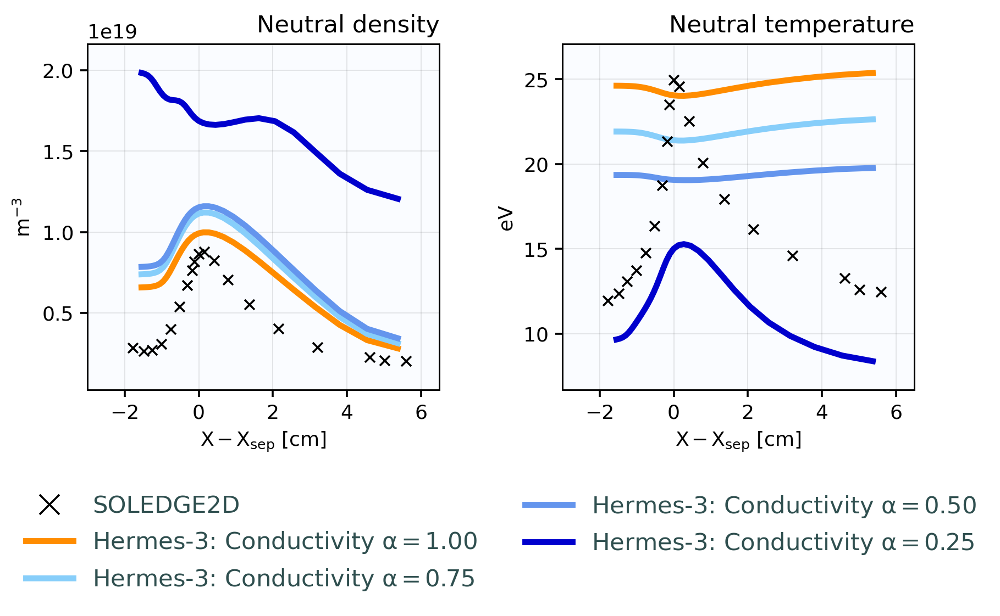

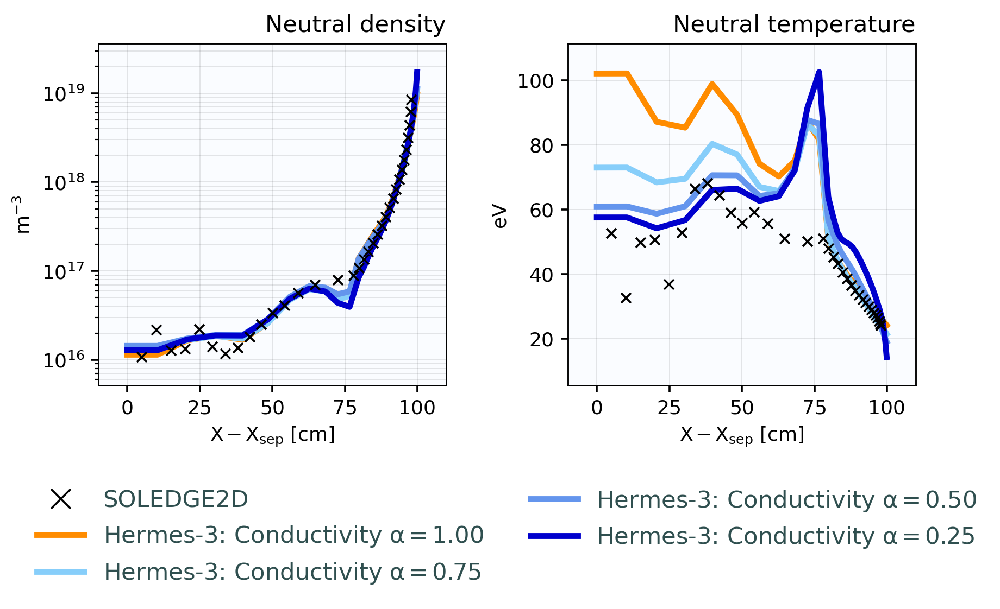

In [34]:

plt.close("all")
lineplot_compare(
    cases = { 
    "SOLEDGE2D" : dict(data=sl["tightwall_2e19"], color="black"),
    r"Hermes-3: Conductivity $\alpha = 1.00$" : dict(data=hr['afnE_mfp1'], color = "darkorange"),
    r"Hermes-3: Conductivity $\alpha = 0.75$" : dict(data=hr['afnE_mfp1_cond0.75'], color = "lightskyblue"),
    r"Hermes-3: Conductivity $\alpha = 0.50$" : dict(data=hr['afnE_mfp1_cond0.5'], color = "cornflowerblue"),
    r"Hermes-3: Conductivity $\alpha = 0.25$" : dict(data=hr['afnE_mfp1_cond0.25'], color = "mediumblue"),

    },
    regions = ["omp", "imp", "outer_lower", "outer_fieldline"],  
    params = ["Na", "Ta"],
    # params = ["Ne", "Te", "Td+", "Na", "Ta"],
    mode = "log",
    dpi = 200,
    lw = 2,
    legend_nrows = 2,
    combine_molecules = True
)

## Extended run deck

In [50]:
casestore.keys()

dict_keys(['base', 'esccore_edgerefl_decaylength', 'frec', 'pump', 'frec_tune', 'afnD_mfp1', 'afnE_mfp1', 'afnE_mfp1_cond0.75', 'afnE_mfp1_cond0.5', 'afnE_mfp1_cond0.25', 'afnE_mfp1_cond0.1', 'afnE_mfp1_cond0.01', 'afnE_mfp1_cond0.25_frec0.00', 'afnE_mfp1_cond0.25_frec0.48', 'afnE_mfp1_cond0.25_frec0.68', 'afnE_mfp1_cond0.25_frec0.48_nonrefl'])

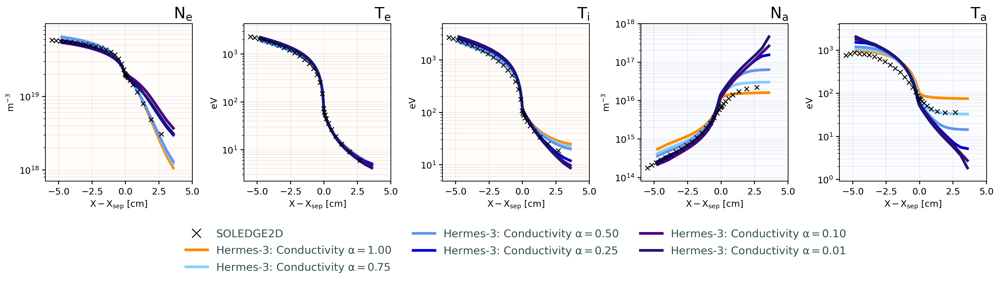

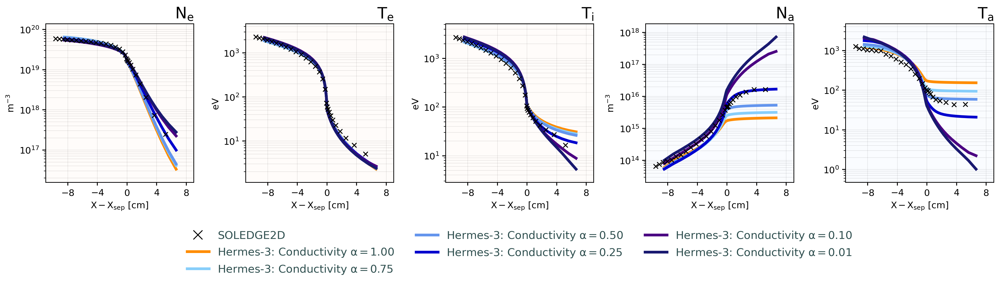

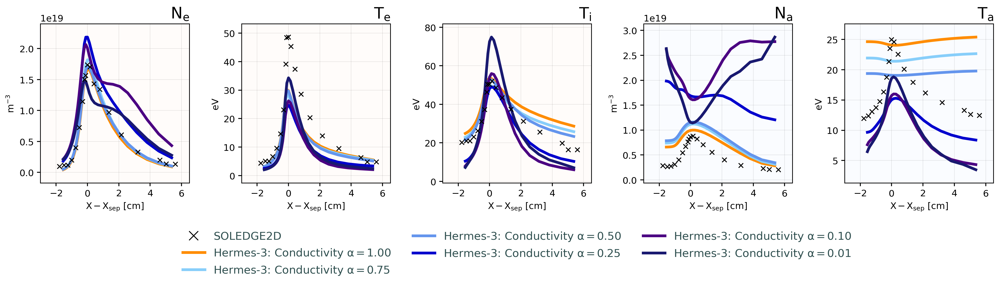

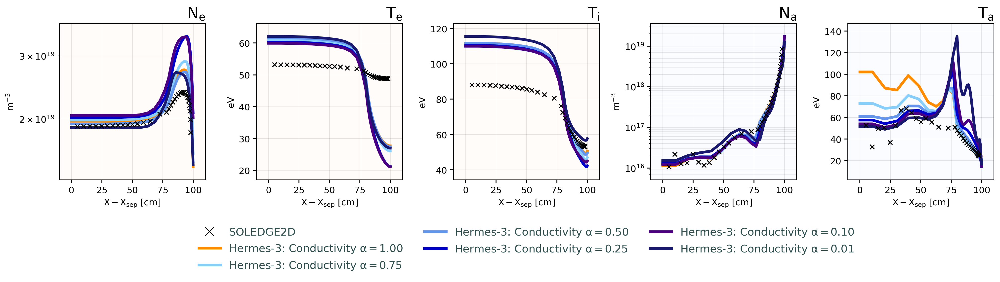

In [53]:

plt.close("all")
lineplot_compare(
    cases = { 
    "SOLEDGE2D" : dict(data=sl["tightwall_2e19"], color="black"),
    r"Hermes-3: Conductivity $\alpha = 1.00$" : dict(data=hr['afnE_mfp1'], color = "darkorange"),
    r"Hermes-3: Conductivity $\alpha = 0.75$" : dict(data=hr['afnE_mfp1_cond0.75'], color = "lightskyblue"),
    r"Hermes-3: Conductivity $\alpha = 0.50$" : dict(data=hr['afnE_mfp1_cond0.5'], color = "cornflowerblue"),
    r"Hermes-3: Conductivity $\alpha = 0.25$" : dict(data=hr['afnE_mfp1_cond0.25'], color = "mediumblue"),
    r"Hermes-3: Conductivity $\alpha = 0.10$" : dict(data=hr['afnE_mfp1_cond0.1'], color = "indigo"),
    r"Hermes-3: Conductivity $\alpha = 0.01$" : dict(data=hr['afnE_mfp1_cond0.01'], color = "midnightblue"),

    },
    regions = ["omp", "imp", "outer_lower", "outer_fieldline"],  
    # params = ["Ne", "Te"],
    params = ["Ne", "Te", "Td+", "Na", "Ta"],
    mode = "log",
    dpi = 200,
    lw = 2,
    legend_nrows = 2
)

# Fast recycling impact

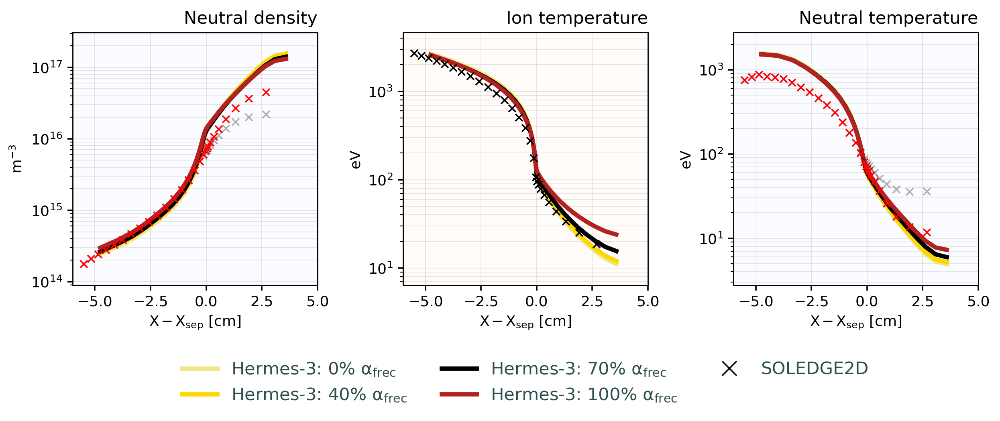

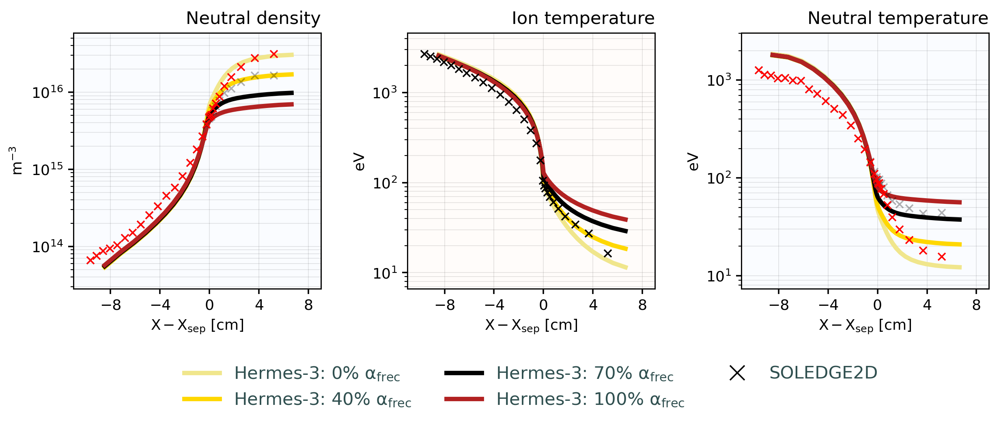

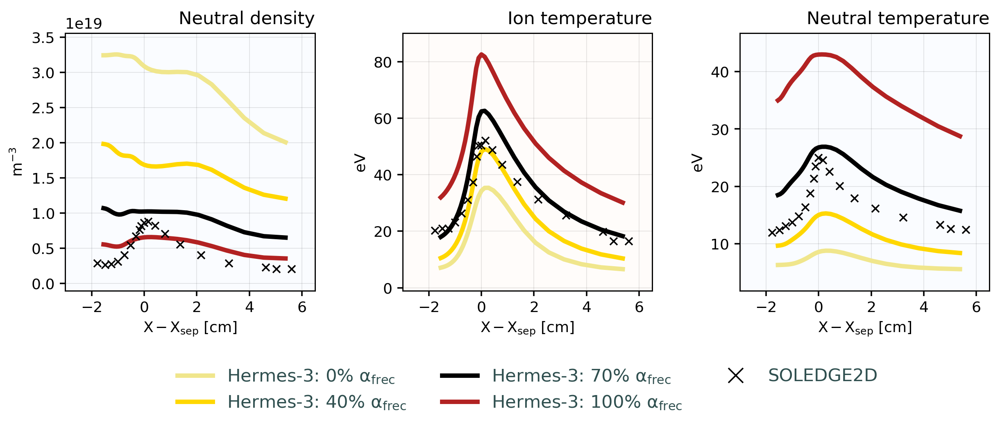

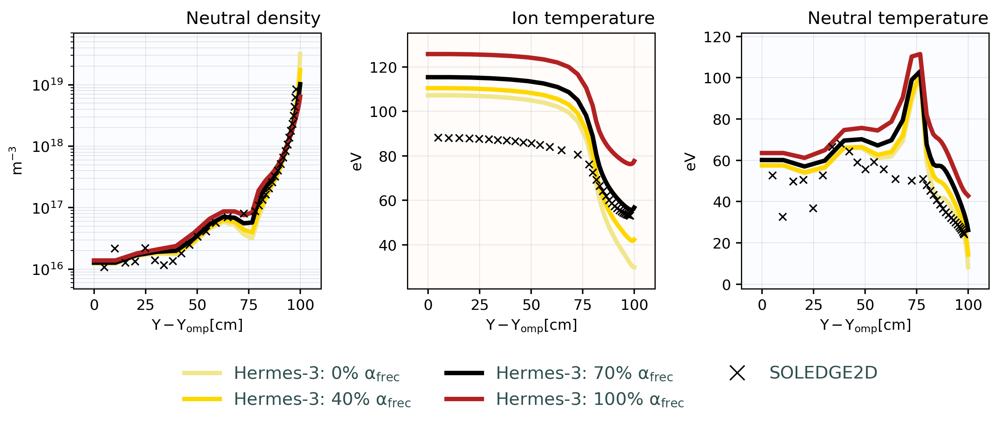

In [49]:

plt.close("all")
lineplot_compare(
    cases = { 


    # Original colors: khaki, gold, darkorange, firebrick

    r"Hermes-3: 0% $\alpha_{frec}$" : dict(data=hr['afnE_mfp1_cond0.25_frec0.00'], color = "khaki"),
    r"Hermes-3: 40% $\alpha_{frec}$" : dict(data=hr['afnE_mfp1_cond0.25'], color = "gold"),
    r"Hermes-3: 70% $\alpha_{frec}$" : dict(data=hr['afnE_mfp1_cond0.25_frec0.48'], color = "black"),
    r"Hermes-3: 100% $\alpha_{frec}$" : dict(data=hr['afnE_mfp1_cond0.25_frec0.68'], color = "firebrick"),
    "SOLEDGE2D" : dict(data=sl["tightwall_2e19"], color="black"),

    },
    regions = ["omp", "imp", "outer_lower", "outer_fieldline"], 
    params = ["Na", "Td+", "Ta"],

    mode = "log",
    dpi = 200,
    lw = 2,
    legend_nrows = 1.5,
    combine_molecules = True
)

# Neutral cooling impact

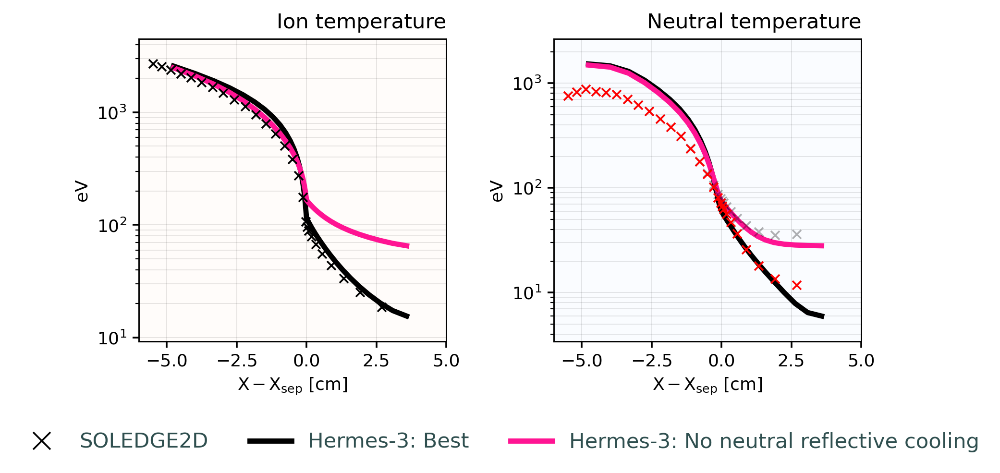

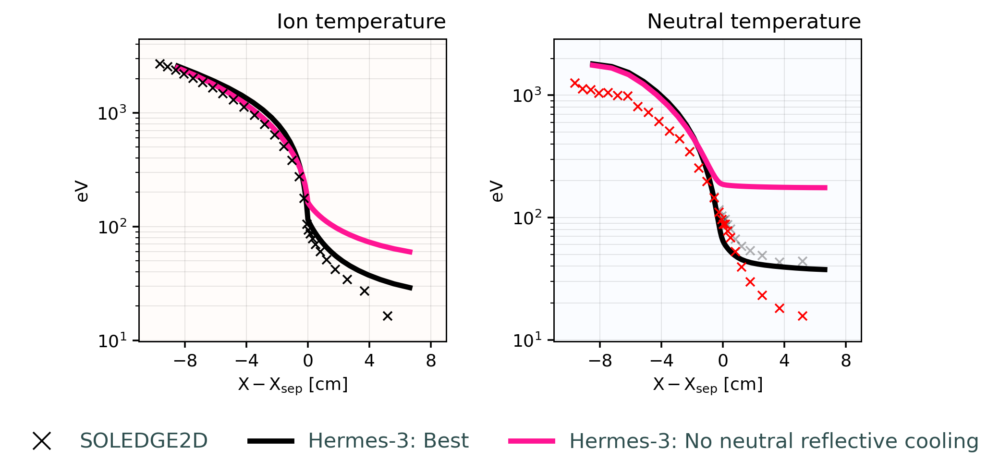

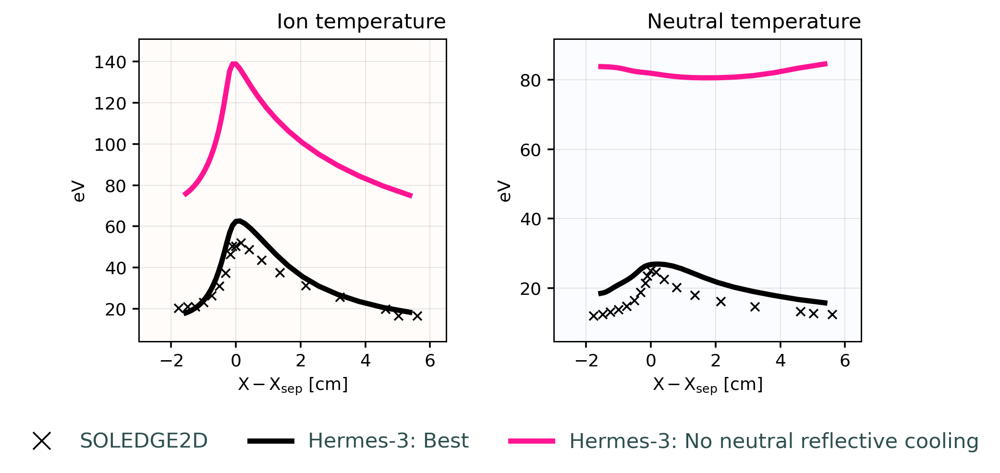

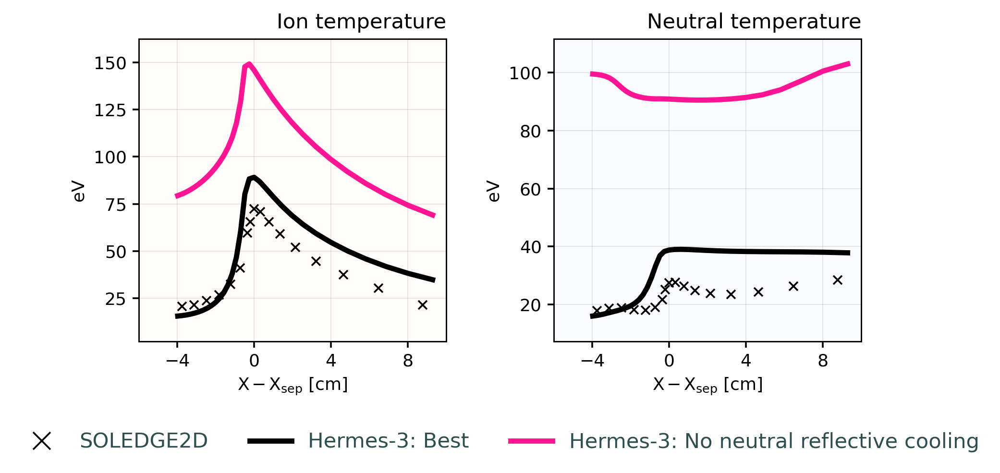

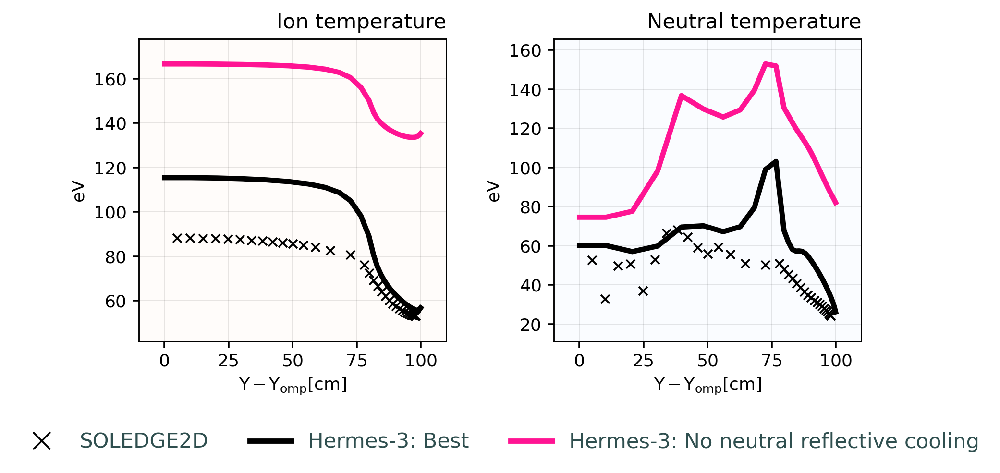

In [51]:

plt.close("all")
lineplot_compare(
    cases = { 


    "SOLEDGE2D" : dict(data=sl["tightwall_2e19"], color="black", marker = "x"),
    r"Hermes-3: Best" : dict(data=hr['afnE_mfp1_cond0.25_frec0.48'], color = "black"),
    r"Hermes-3: No neutral reflective cooling" : dict(data=hr['afnE_mfp1_cond0.25_frec0.48_nonrefl'], color = "deeppink"),

    },
    regions = ["omp", "imp", "outer_lower", "inner_lower", "outer_fieldline"],
    params = ["Td+",  "Ta"],
    # params = ["Pe", "Pd+", "Pa"],

    mode = "log",
    dpi = 200,
    lw = 2,
    legend_nrows = 1,
    combine_molecules = True
)

# Remaining discrepancies

## X-point heating

0 100


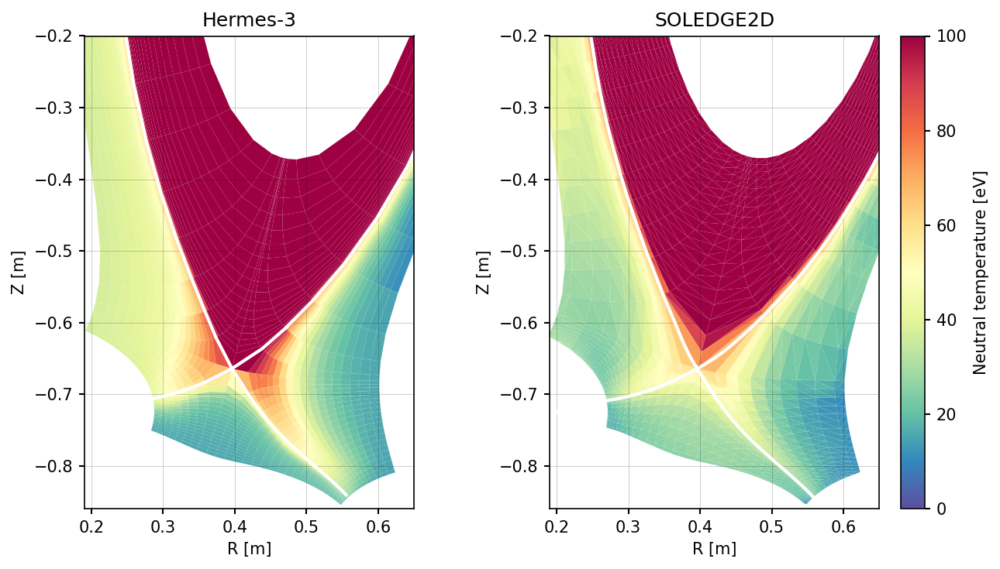

In [47]:

slc_wide = SOLEDGEcase(path = soledgecases["widewall_2e19"])

fig, axes = plt.subplots(1,2, dpi = 150, figsize = (9,5))

vmin = 0
vmax = 100
logscale = False

# slc = SOLEDGEcase(path = soledgecases["widewall_2e19"])
# slc.plot_2d(param = "TotRadi", fig=fig, ax=axes[0], cbar = False, logscale = True, vmin = vmin, vmax = vmax, cmap = "Spectral_r")
# axes[0].set_title("SOLEDGE2D: Full grid")
# axes[0].set_xlim(0.15, 1.0)
ds = casestore["afnE_mfp1_cond0.25_frec0.48"].ds.isel(t=-1,  theta=slice(2,-2))
data = ds["Td"]
data.hermesm.clean_guards().hermesm.polygon(ax = axes[0], cmap = "Spectral_r", vmin = vmin, vmax = vmax, logscale = logscale, antialias = True, add_colorbar = False, colorbar_label = "Neutral temperature [eV]")
axes[0].set_title("Hermes-3")

slc = SOLEDGEcase(path = soledgecases["tightwall_2e19"])
slc.plot_2d(param = "Tni", fig=fig, ax=axes[1], cbar = True, cbar_label = "Neutral temperature [eV]", logscale = logscale, vmin = vmin, vmax = vmax, cmap = "Spectral_r")
axes[1].set_title("SOLEDGE2D")


fline = ds.isel(x=22, theta = slice(70,None))

# for ax in axes:
#     ax.plot(fline["R"], fline["Z"], c= "k", lw = 3, ls = ":", alpha = 0.5)


for ax in axes:
    ax.set_ylim(-0.86, -0.2)
    ax.set_xlim(0.19, 0.65)
    ax.grid(alpha = 0.3, c = "k")
    ax.set_xlabel("R [m]")
    ax.set_ylabel("Z [m]")
fig.tight_layout()

0.1 10


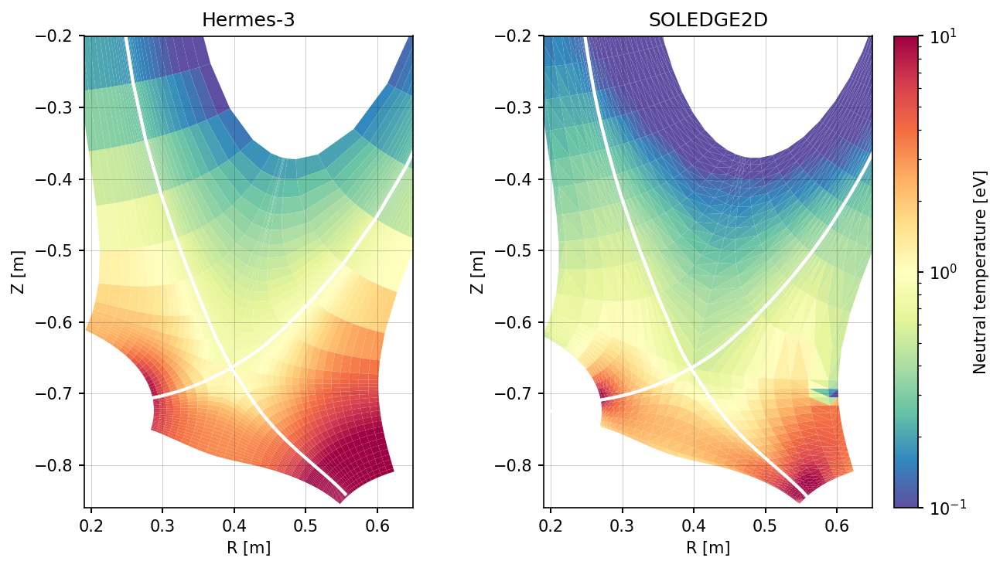

In [22]:

slc_wide = SOLEDGEcase(path = soledgecases["widewall_2e19"])

fig, axes = plt.subplots(1,2, dpi = 150, figsize = (9,5))

vmin = 0.1
vmax = 10
logscale = True

ds = casestore["afnE_mfp1_cond0.01"].ds.isel(t=-1,  theta=slice(2,-2))
data = ds["Pd"]
data.hermesm.clean_guards().hermesm.polygon(ax = axes[0], cmap = "Spectral_r", vmin = vmin, vmax = vmax, logscale = logscale, antialias = True, add_colorbar = False, colorbar_label = "Neutral temperature [eV]")
axes[0].set_title("Hermes-3")

slc = SOLEDGEcase(path = soledgecases["tightwall_2e19"])
slc.plot_2d(param = "Pni", fig=fig, ax=axes[1], cbar = True, cbar_label = "Neutral temperature [eV]", logscale = logscale, vmin = vmin, vmax = vmax, cmap = "Spectral_r")
axes[1].set_title("SOLEDGE2D")
fline = ds.isel(x=22, theta = slice(70,None))

for ax in axes:
    ax.set_ylim(-0.86, -0.2)
    ax.set_xlim(0.19, 0.65)
    ax.grid(alpha = 0.3, c = "k")
    ax.set_xlabel("R [m]")
    ax.set_ylabel("Z [m]")
fig.tight_layout()

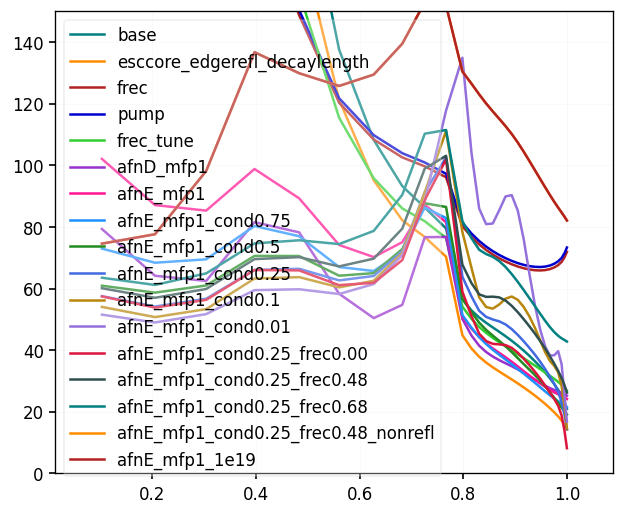

In [16]:
fig, ax = plt.subplots()

for i, name in enumerate(casestore):
    ds = casestore[name].ds.isel(t=-1)
    m = ds.metadata
    
    fl = ds.isel(x = m["ixseps1"], theta = slice(76,-2))
    dist = np.cumsum(fl["dl"])
    
    ax.plot(dist, fl["Td"], label = name)
    
ax.set_ylim(0,150)
ax.legend()
    

## e-i equilibration

In [19]:
for name in ["tightwall_2e19"]:
    sp[name] = SOLPSdata()
    # sp[name].read_last10s(solpscases[name])
    sp[name].read_from_case(solpscases[name])

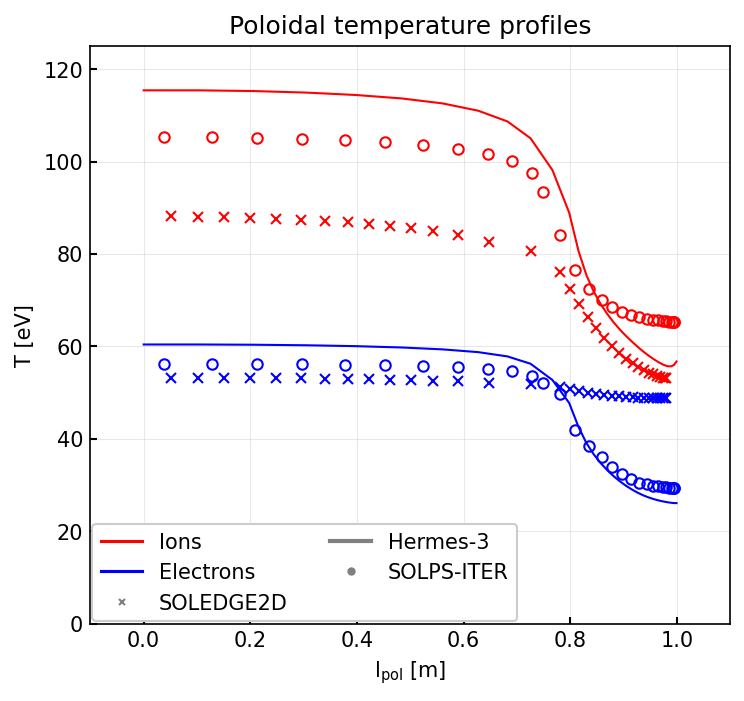

In [23]:
fig, ax = plt.subplots(figsize=(5.5,5),dpi = 150)

# sl_data = sl["tightwall_2e19"].regions["outer_fieldline"]
# hr_data = hr["afnE_base"].regions["outer_fieldline"]
# sp_data = sp["tightwall_2e19"].regions["outer_fieldline"]

sl_data = sl["tightwall_2e19"].regions["outer_fieldline"]
hr_data = hr["afnE_mfp1_cond0.25_frec0.48"].regions["outer_fieldline"]
sp_data = sp["tightwall_2e19"].regions["outer_fieldline"]


slstyle = dict(marker = "x", ms = 5, lw = 0)
spstyle = dict(marker = "o", markerfacecolor="None", ms = 5, lw = 0)
hrstyle = dict(lw = 1)

ax.plot(sl_data.index, sl_data["Te"], c = "blue", **slstyle)
ax.plot(sl_data.index, sl_data["Td+"], c = "red", **slstyle)
# ax.plot(sl_data.index, sl_data["Ta"], c = "deeppink", **slstyle)

ax.plot(hr_data.index, hr_data["Te"], c = "blue", **hrstyle, label = "Electrons")
ax.plot(hr_data.index, hr_data["Td+"], c = "red", **hrstyle, label = "Ions")

ax.plot(sp_data.index-0.05, sp_data["Te"], c = "blue", **spstyle, label = "Electrons")
ax.plot(sp_data.index-0.05, sp_data["Td+"], c = "red", **spstyle, label = "Ions")

clog = 31 - 0.5 * np.log(sl_data["Ne"]) + np.log(sl_data["Te"])

ax.set_xlabel("$l_{pol}$ [m]")
ax.set_ylabel("T [eV]")
ax.set_title("Poloidal temperature profiles")

ax.set_ylim(0,125)
legend_items = []

legend_items.append(mpl.lines.Line2D([0], [0], color = "red"))
legend_items.append(mpl.lines.Line2D([0], [0], color = "blue"))
legend_items.append(mpl.lines.Line2D([0], [0], color="grey", lw = 0, marker = "x", ms = 3))
legend_items.append(mpl.lines.Line2D([0], [0], color="grey", lw = 2, ))
legend_items.append(mpl.lines.Line2D([0], [0], color="grey", lw = 0, marker = "o", ms = 3))
ax.legend(legend_items, ["Ions", "Electrons", "SOLEDGE2D", "Hermes-3", "SOLPS-ITER"], fontsize = "medium", loc = "lower left", frameon = True, framealpha = 1,ncols = 2)

c:\Users\mikek\OneDrive\Project\python-packages\soledge\routines\h5_routines.py:65: FutureWarning: In the future `np.str` will be defined as the corresponding NumPy scalar.
  Data = Data.astype(np.str)


1.018537486031338 5.5337896964936455


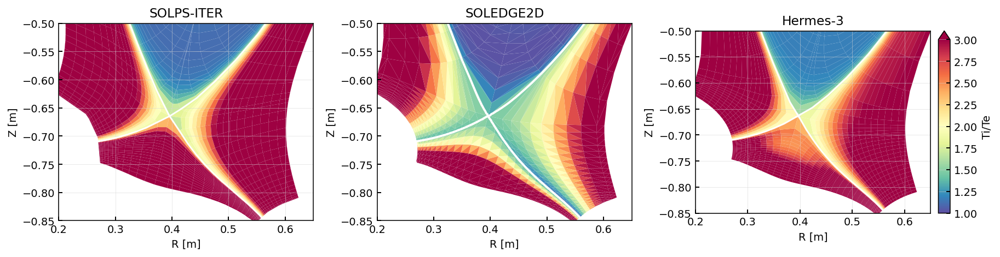

In [30]:
fig, axes = plt.subplots(1,3, figsize = (15,5))

norm = create_norm(False, None, 1, 3)

## SOLPS
spc = SOLPScase(solpscases["tightwall_2e19"])
ratio = spc.bal["ti"] / spc.bal["te"]
spc.plot_2d(r"Ti/Te", norm = norm, data = ratio, cbar = False, logscale = False, ax = axes[0], antialias = True)


## SOLEDGE
slc = SOLEDGEcase(soledgecases["tightwall_2e19"])
Ti = slc._get_2d_on_tri("Tempi")
Te = slc._get_2d_on_tri("Tempe")
ratio = Ti/Te


slc.plot_2d(fig = fig, ax = axes[1], data = ratio, norm = norm, logscale = False, linewidth = 0)


## Hermes-3
ds = casestore["afnE_mfp1_cond0.25_frec0.48"].ds.isel(t=-1)
(ds["Td+"] / ds["Te"]).hermesm.clean_guards().bout.polygon(ax = axes[2], cmap = "Spectral_r", logscale = False, add_colorbar = False, norm = norm, antialias = True,
separatrix_kwargs = dict(color = "white", linestyle = "solid"), targets = False)


for ax in axes.flatten():
    # ax.set_ylim(-0.85, 0.05)
    
    ax.set_xlim(0.2, 0.65)
    ax.set_ylim(-0.85, -0.5)
    
    
    ax.set_xlabel("R [m]")
    ax.set_ylabel("Z [m]")
    
    
divider = make_axes_locatable(axes[2])
cax = divider.append_axes("right", size="5%", pad=0.1)
fig.colorbar(mpl.cm.ScalarMappable(norm = norm, cmap = "Spectral_r"), cax = cax, label = "Ti/Te", extend = "max")
    
axes[0].set_title("SOLPS-ITER")
axes[1].set_title("SOLEDGE2D")
axes[2].set_title("Hermes-3")
fig.subplots_adjust(wspace = 0.25)

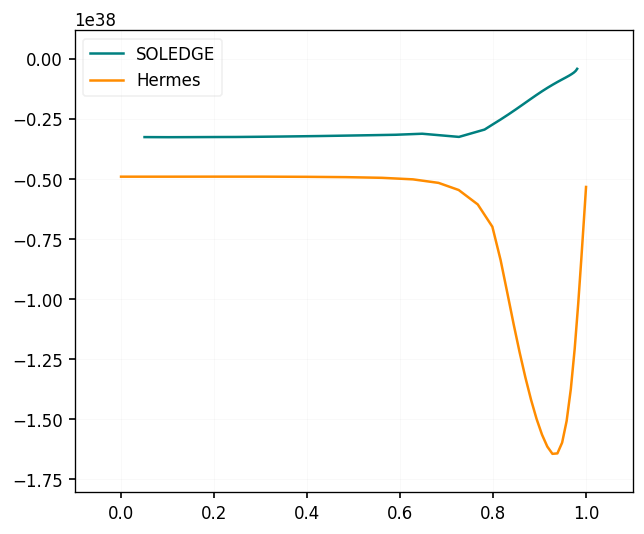

In [19]:
fig, ax = plt.subplots()

ax.plot(sl_data.index, sl_data["Ne"]**2 * (sl_data["Te"] - sl_data["Td+"])/sl_data["Te"]**(1.5), label = "SOLEDGE")
ax.plot(hr_data.index, hr_data["Ne"]**2 * (hr_data["Te"] - hr_data["Td+"])/hr_data["Te"]**(1.5), label = "Hermes")

ax.legend()
